<a href="https://colab.research.google.com/github/GleiconMaior/GleiconMaior/blob/main/PCA_Roughness_Scaled.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Código por Inteiro

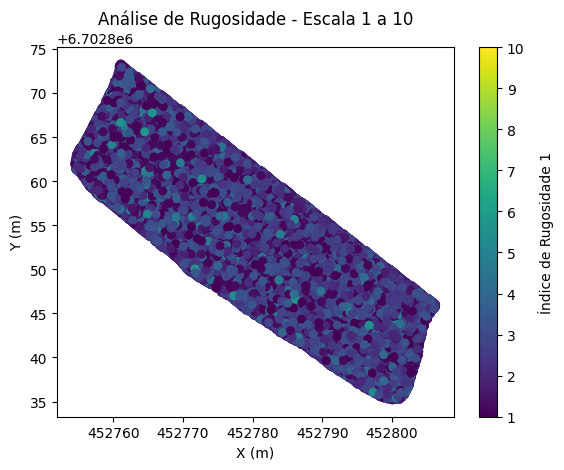

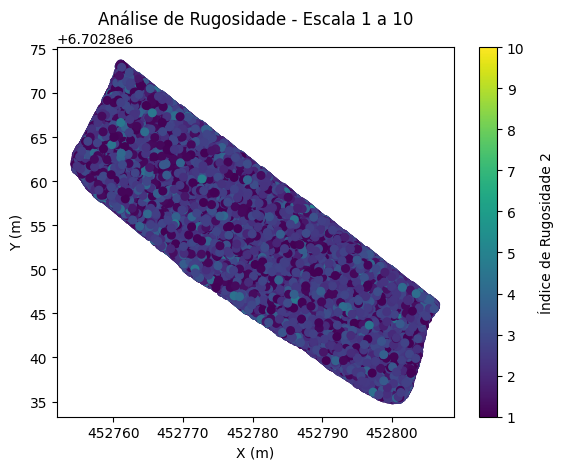

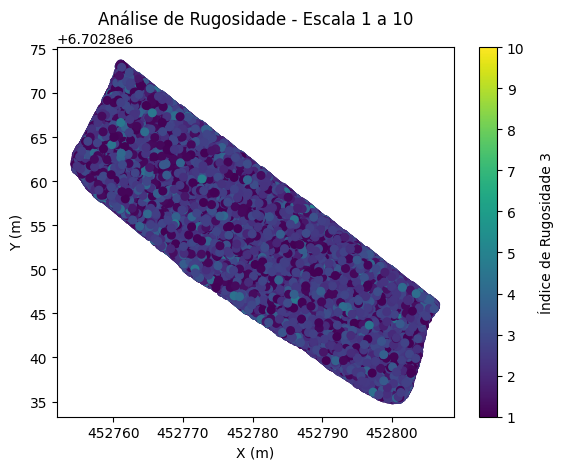

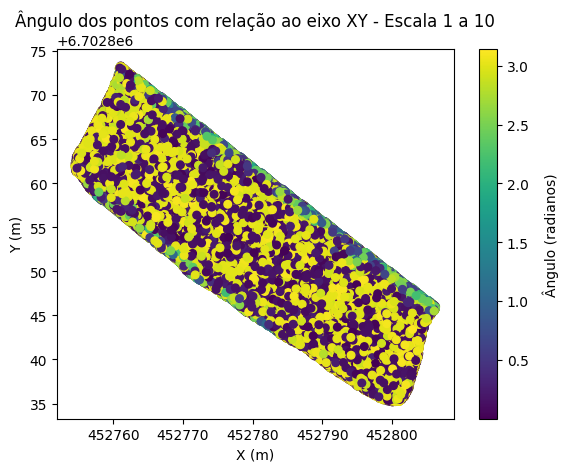

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle

# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta

# Função para escalar os valores para a escala de 1 a 10
def scale_values(values):
    scaler = MinMaxScaler(feature_range=(1, 10))
    return scaler.fit_transform(np.array(values).reshape(-1, 1)).flatten()

# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/Area_estudo_Matrice_60m.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df_red = df.sample(frac=0.5)

# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')


In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.0027286950283209634 2.3533119492525896


#Código Fragmentado

##ANGLO FASE4 TRECHO 1 - RR 5%
RR 5%

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/FASE4_TRECHO1_RR5.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,665093.88,7909239.48,856.20
1,665096.38,7909252.03,855.97
2,665094.98,7909250.51,856.77
3,665096.39,7909243.25,855.09
4,665096.39,7909247.06,855.14
...,...,...,...
275425,665102.97,7909335.90,859.80
275426,665104.42,7909337.59,858.32
275427,665097.13,7909339.20,858.89
275428,665102.07,7909337.74,860.03


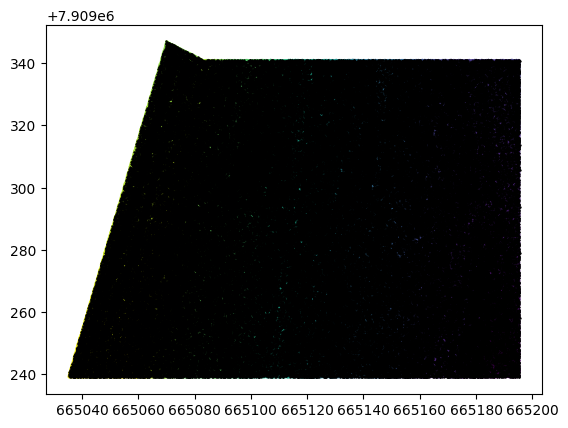

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

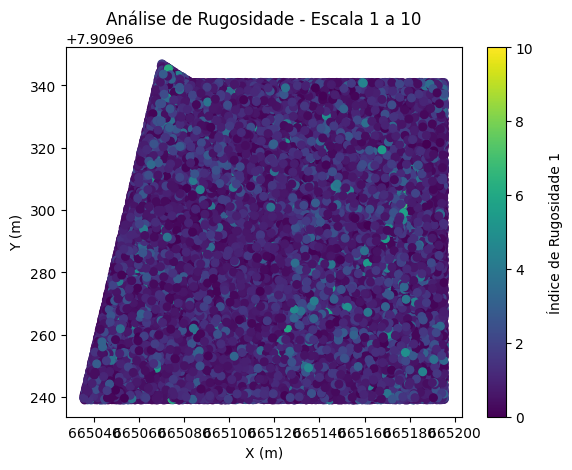

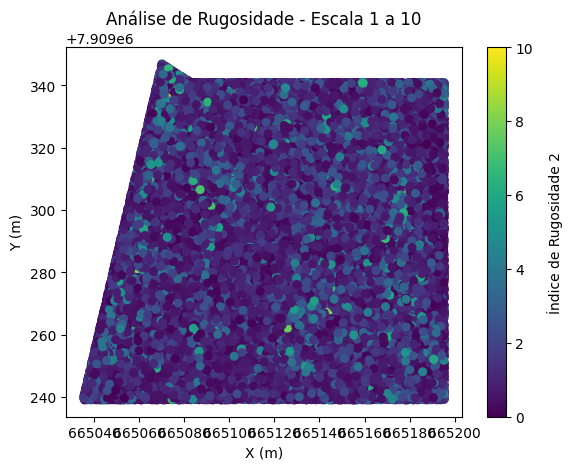

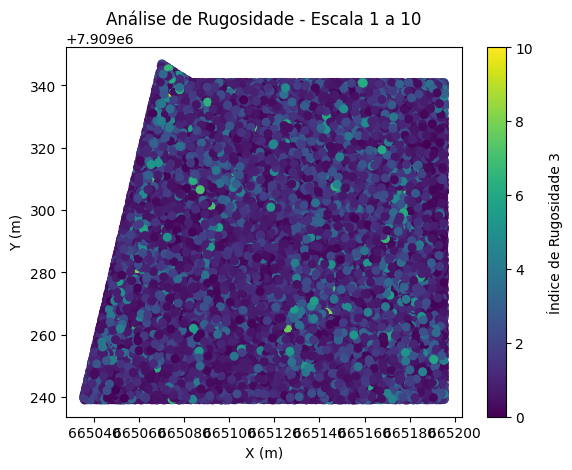

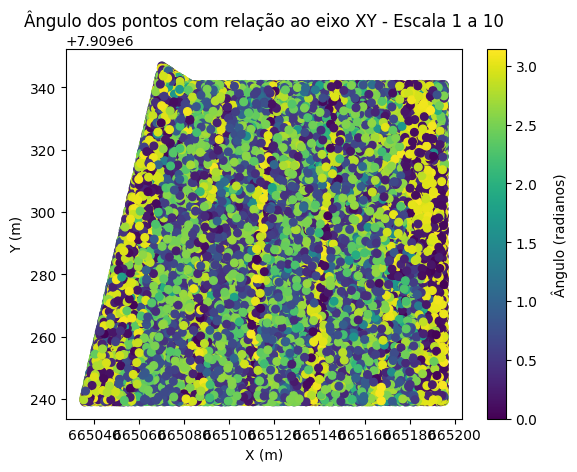

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.03152131844024774 1.1435368697130988


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 0.0006559779461750007 0.863337952818403
Variância da rugosidade 2 (real, normalizada): 0.011167777360081673 1.5166586099490205
Variância da rugosidade 3 (real, normalizada): 0.011167777360081673 1.5166586099490205
Variância do ângulo (real, normalizada): 1.175713572028559 11.912469074229454


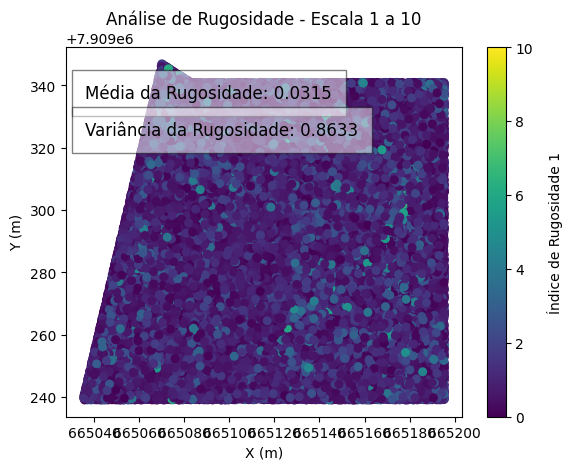

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

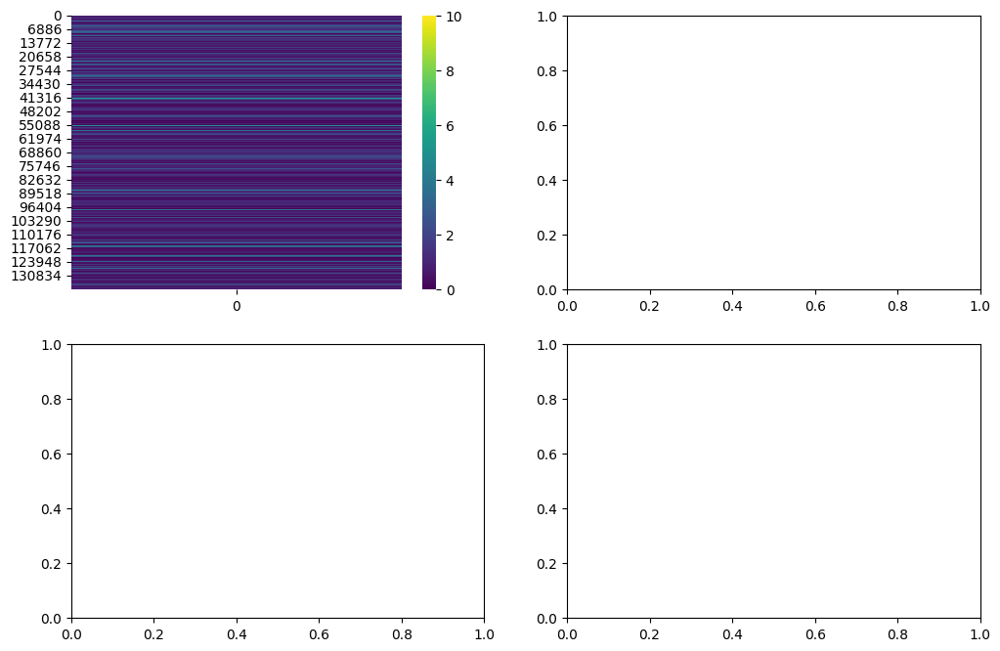

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_1_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


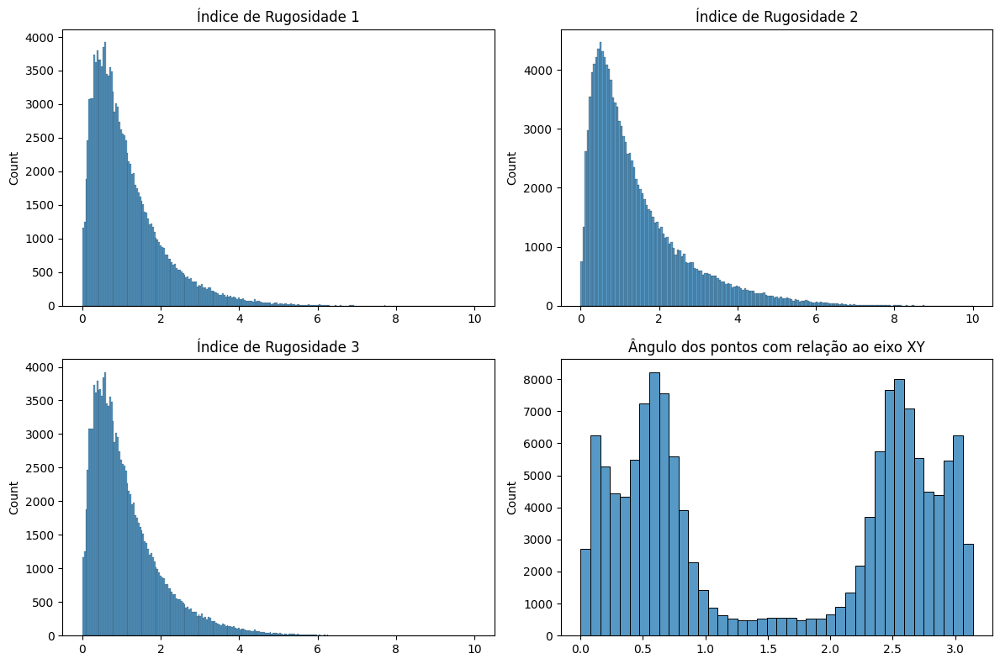

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

Mean rugosidade: 0.0315 - Resistência ao rolamento: 4


##ANGLO OPOSTOFASE4 TRECHO 1 - pré obra - RR 5%
RR 5%

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/FASE4OPOSTA_inicialRR4.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,665100.00,7908356.34,863.63
1,665100.00,7908353.70,863.08
2,665100.00,7908357.49,862.27
3,665100.00,7908356.75,862.00
4,665100.00,7908355.05,862.61
...,...,...,...
599414,665102.09,7908726.39,904.02
599415,665102.16,7908726.66,903.89
599416,665102.16,7908726.87,903.82
599417,665102.16,7908727.14,903.68


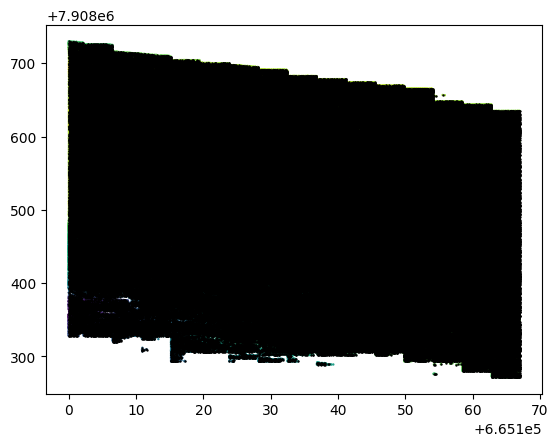

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

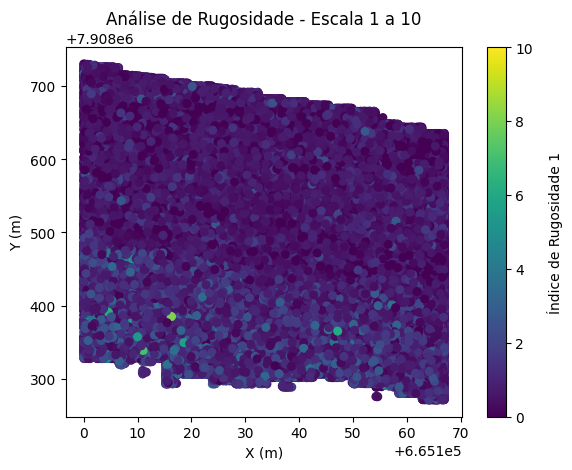

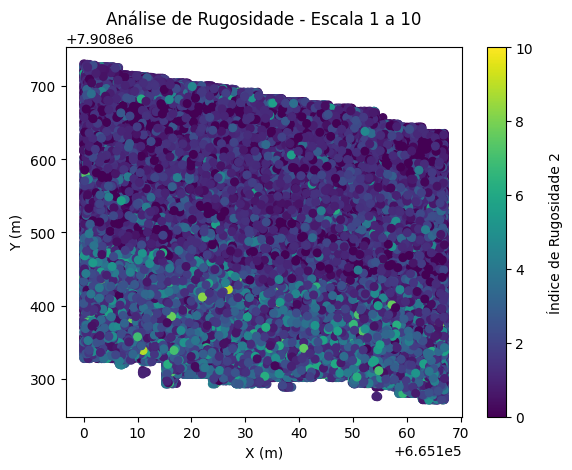

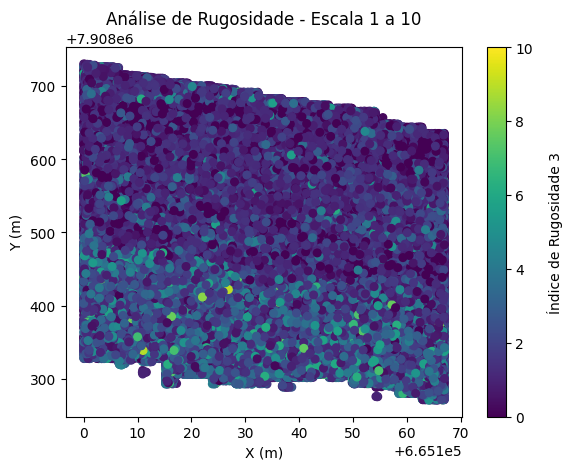

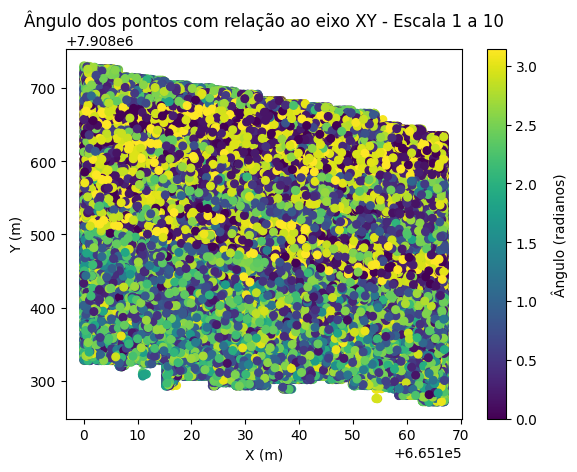

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.03876129203347956 0.8038512031400831


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 0.0010395375330856014 0.44709006224901887
Variância da rugosidade 2 (real, normalizada): 0.01509036345410302 1.9278624860877458
Variância da rugosidade 3 (real, normalizada): 0.01509036345410302 1.9278624860877458
Variância do ângulo (real, normalizada): 1.2934942315225995 13.105836657240582


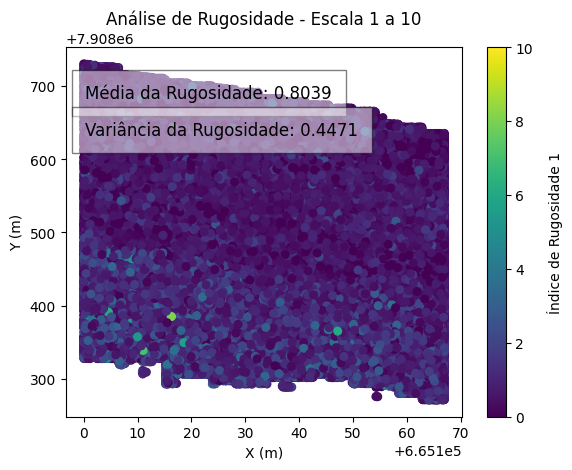

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade_2, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

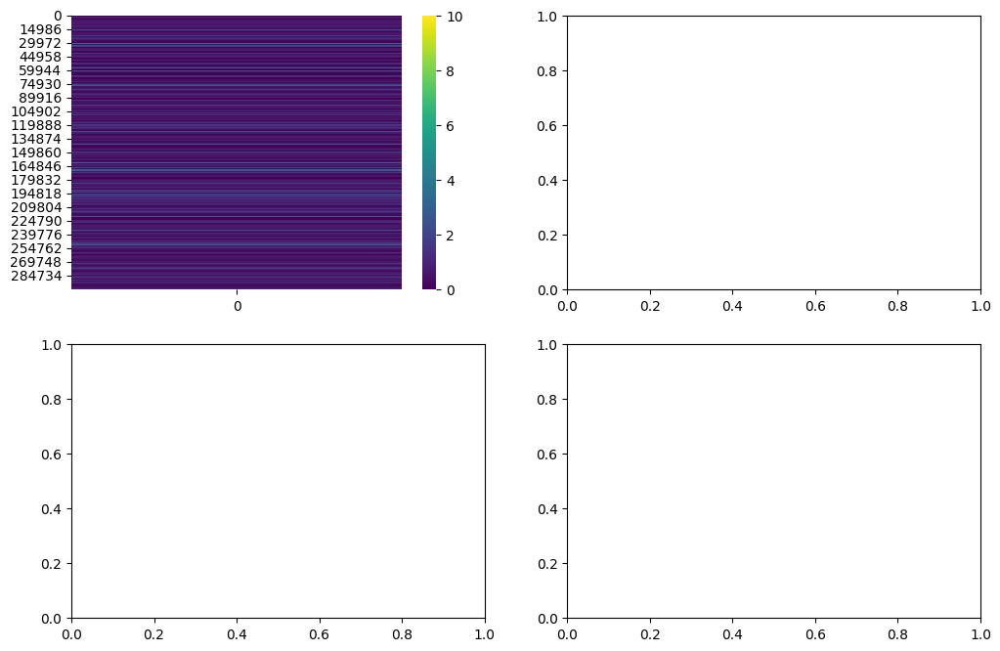

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_1_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


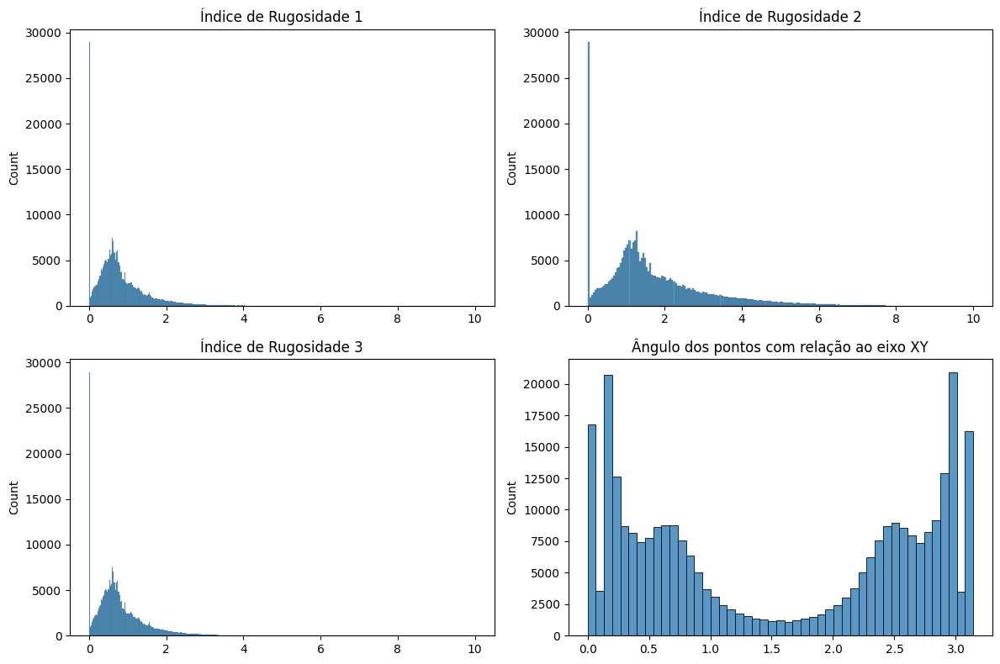

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

Mean rugosidade: 0.0388 - Resistência ao rolamento: 5


##ANGLO OPOSTAFASE4 TRECHO 1 - pós obra - RR 3 - 4%
RR 3 - 4%

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/FASE4OPOSTA_POSOBRA_RR3.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,665136.95,7908250.16,881.06
1,665137.13,7908249.97,881.36
2,665137.19,7908249.43,881.57
3,665137.23,7908250.30,881.30
4,665137.26,7908249.75,881.40
...,...,...,...
876997,665156.57,7908767.07,869.29
876998,665138.44,7908781.06,868.38
876999,665139.03,7908781.00,868.23
877000,665138.69,7908781.14,868.27


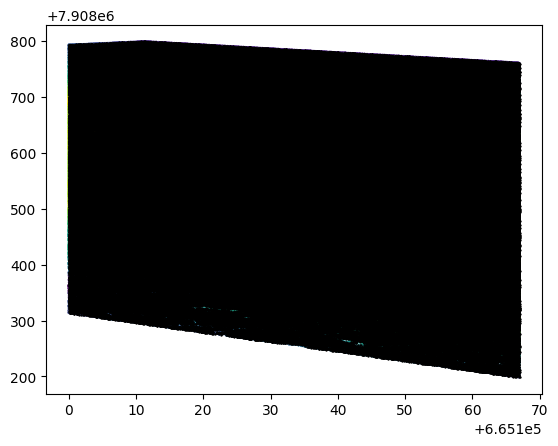

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

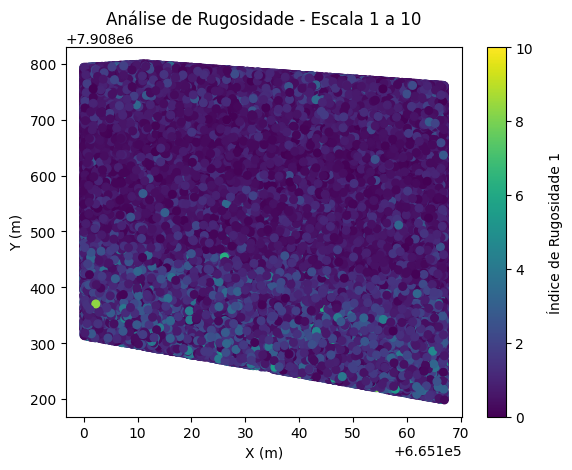

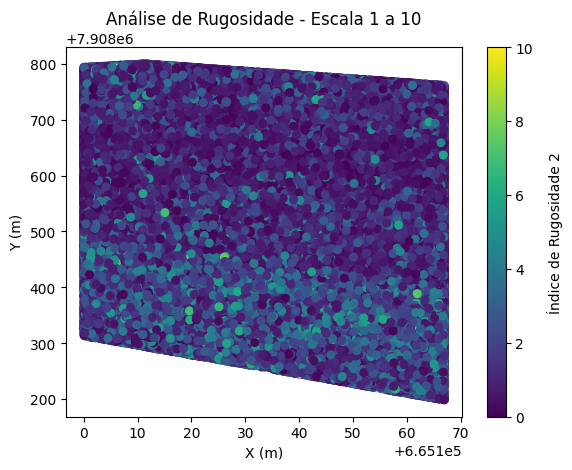

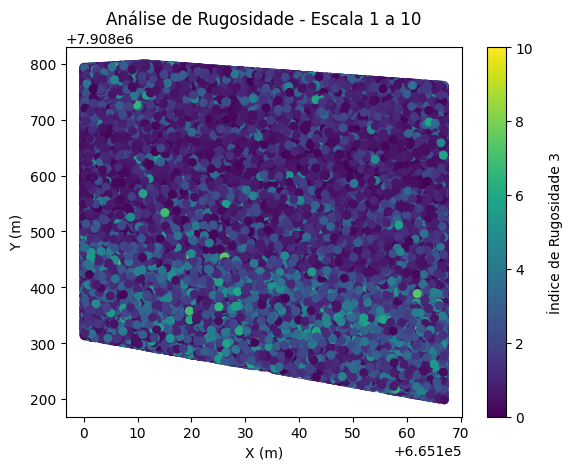

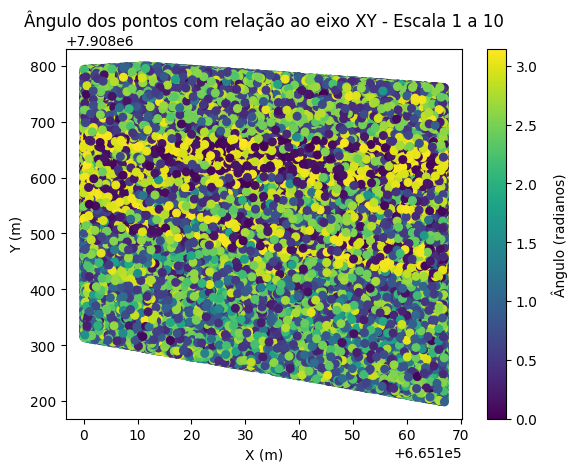

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.03581360760798734 0.8685991823381192


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 0.0010134020828242681 0.5961073587012558
Variância da rugosidade 2 (real, normalizada): 0.015608071691345343 1.7968545728157412
Variância da rugosidade 3 (real, normalizada): 0.015608071691345343 1.7968545728157412
Variância do ângulo (real, normalizada): 1.2248832592907515 12.410662165502352


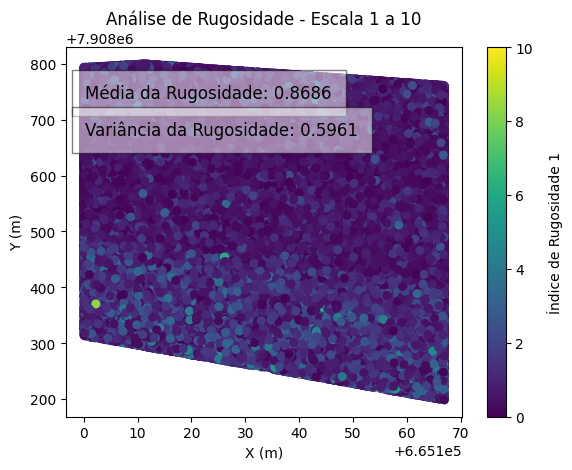

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade_2, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

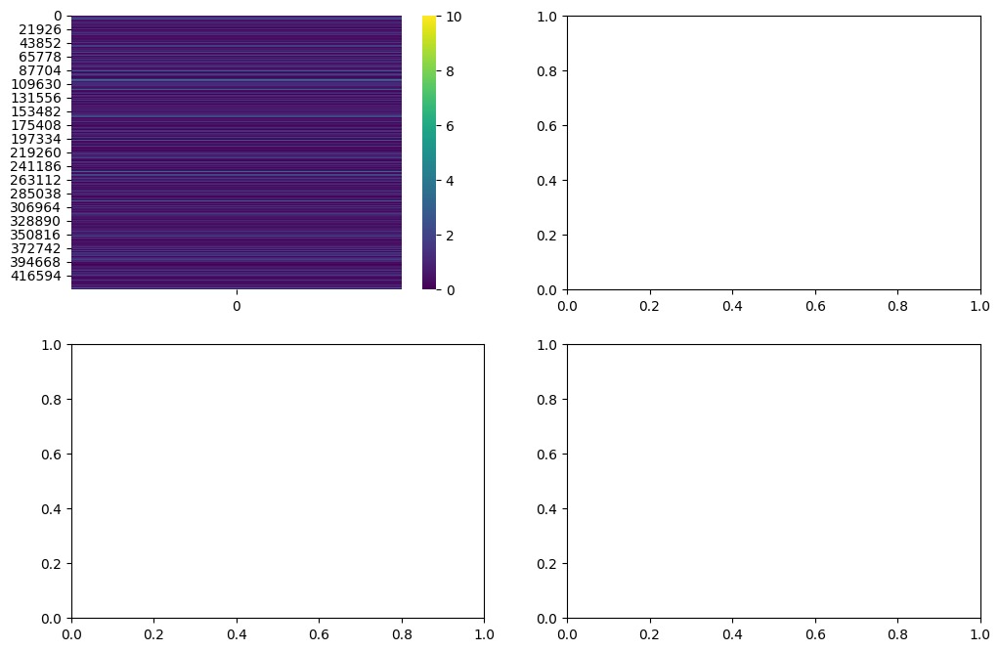

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_1_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


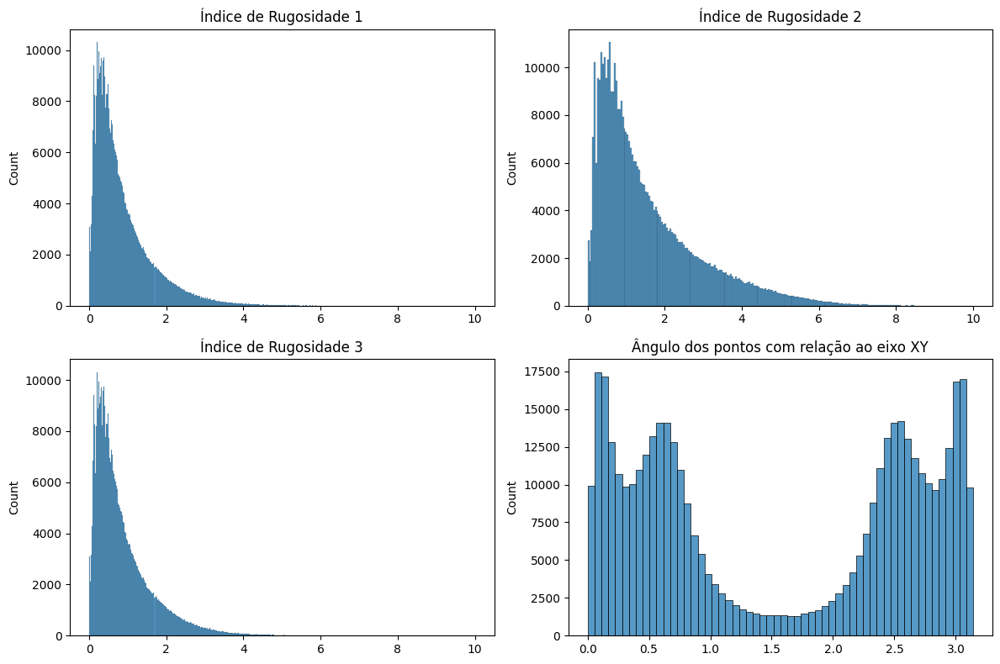

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

Mean rugosidade: 0.0358 - Resistência ao rolamento: 5


##ANTAMINA FASE9 TRECHO 1 - RR 3 - 4%
RR 3 - 4%

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/ANTAMINA_FASE9_TRECHO 2.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,274024.550,8946307.867,4221.991
1,274025.399,8946307.859,4222.112
2,274025.411,8946307.602,4222.143
3,274023.803,8946308.093,4221.953
4,274024.801,8946307.900,4222.045
...,...,...,...
827871,274072.357,8946325.481,4226.339
827872,274072.575,8946325.553,4226.338
827873,274072.631,8946325.596,4226.401
827874,274072.575,8946325.508,4226.438


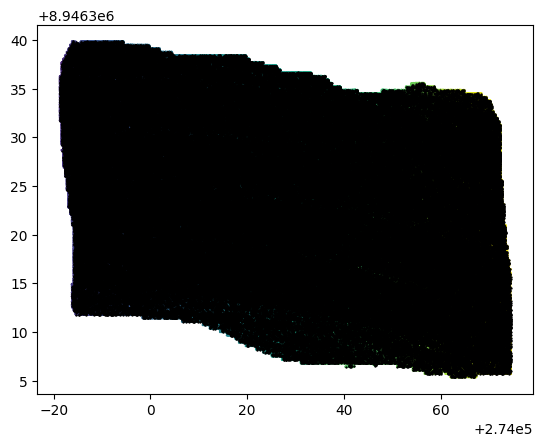

In [ ]:
df_red = df.sample(frac=0.25)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

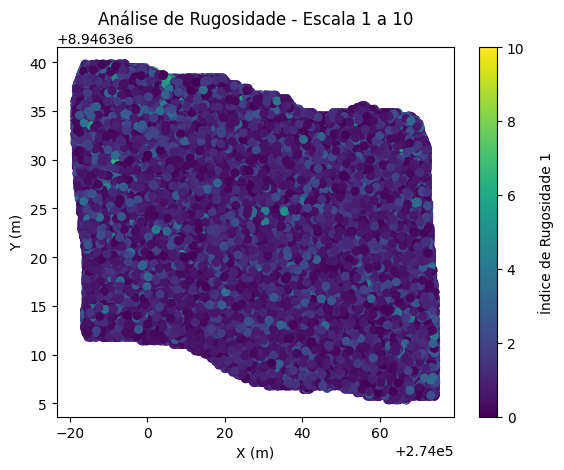

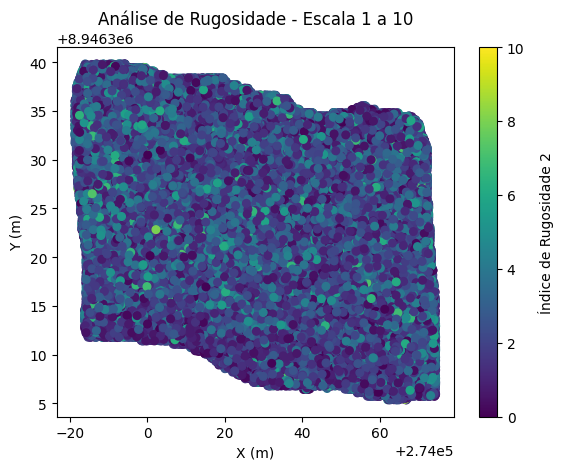

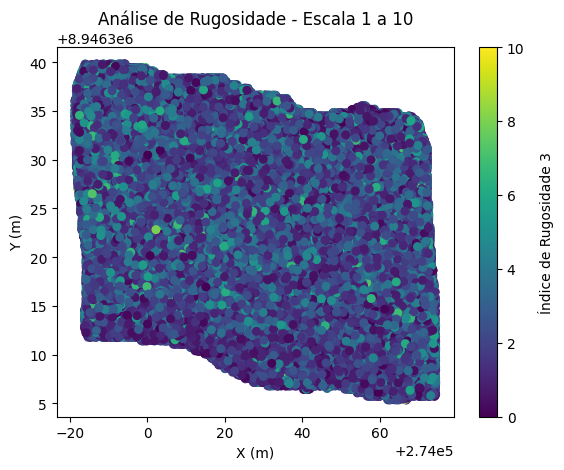

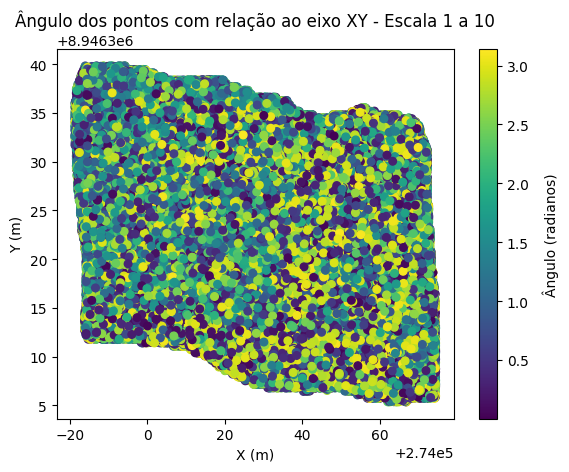

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.013309554399259746 1.0367147653125053


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 0.0001124469064667541 0.6822429421748607
Variância da rugosidade 2 (real, normalizada): 0.01922125589397946 2.0918447639601454
Variância da rugosidade 3 (real, normalizada): 0.01922125589397946 2.0918447639601454
Variância do ângulo (real, normalizada): 1.0242108249864443 10.403933967699116


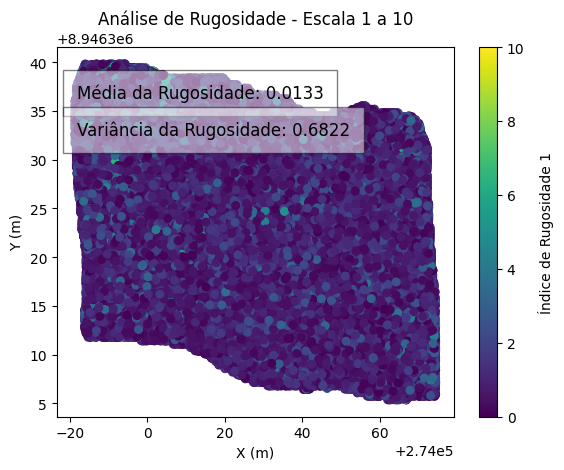

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

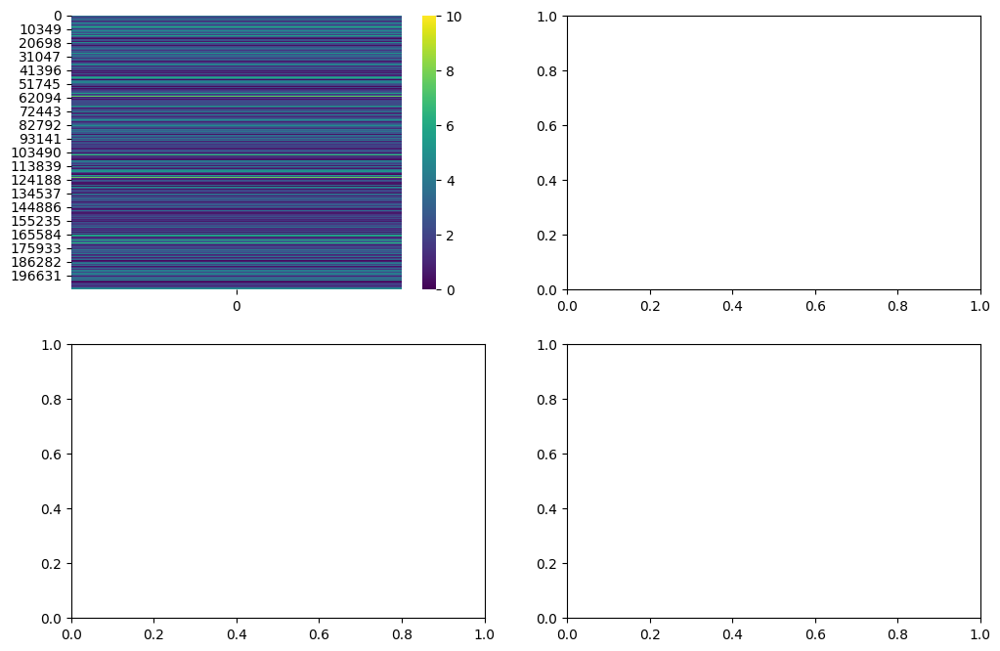

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_2_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


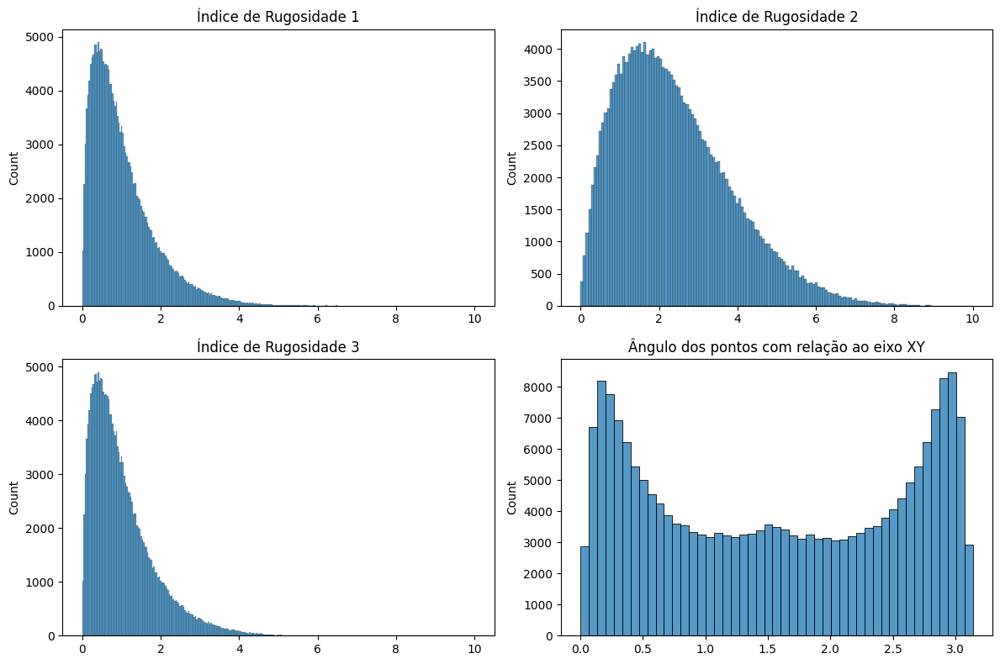

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

Mean rugosidade: 0.0133 - Resistência ao rolamento: 3


##VILA RICA TRECHO 1 - RR2% - Matrice 60 metros
RR 2%

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/Area_estudo_Matrice_60m_RR2.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,452798.144,6702835.840,80.333
1,452798.124,6702836.058,80.343
2,452798.238,6702835.860,80.322
3,452798.100,6702835.838,80.329
4,452798.253,6702836.054,80.327
...,...,...,...
667823,452761.798,6702872.525,83.116
667824,452761.853,6702872.599,83.086
667825,452761.934,6702872.720,83.089
667826,452761.178,6702873.188,83.145


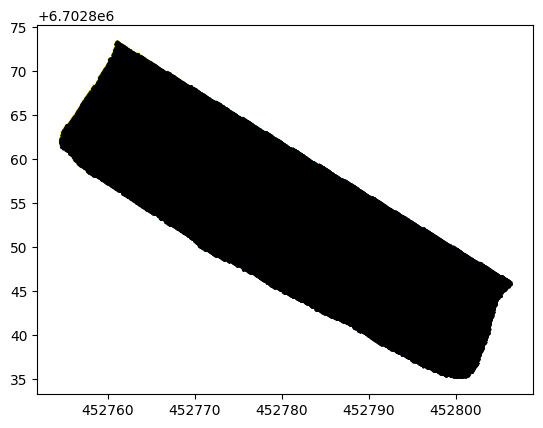

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

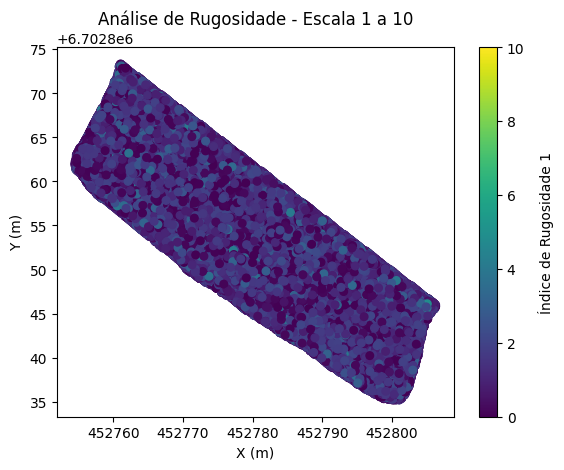

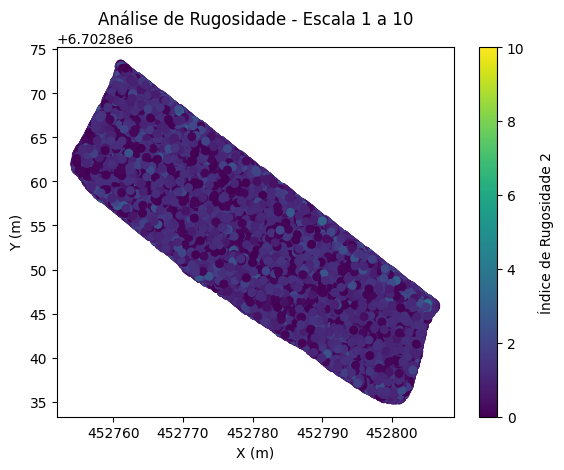

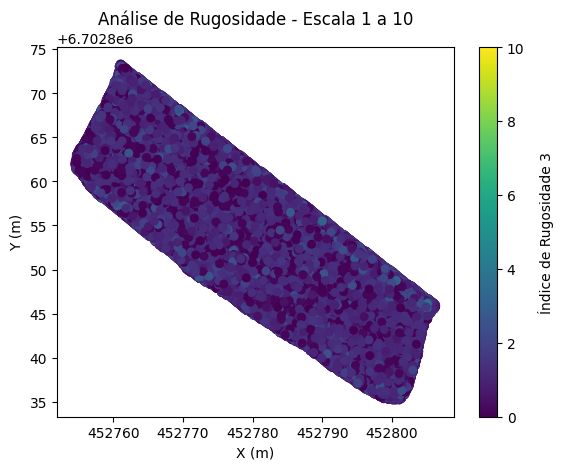

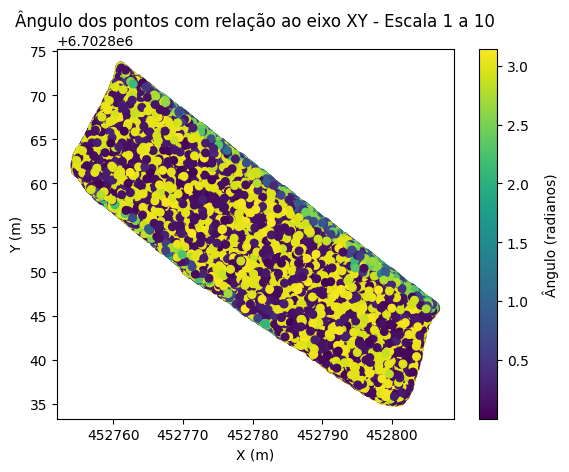

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.002733654276653201 1.205074989099241


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 3.7309560192756704e-06 0.7250385490084024
Variância da rugosidade 2 (real, normalizada): 0.0020044908051002988 0.4073142446716141
Variância da rugosidade 3 (real, normalizada): 0.0020044908051002988 0.4073142446716141
Variância do ângulo (real, normalizada): 1.9484407759662459 19.743781182848632


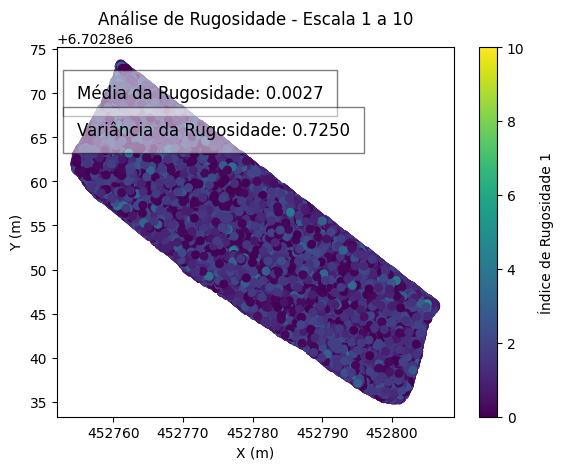

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

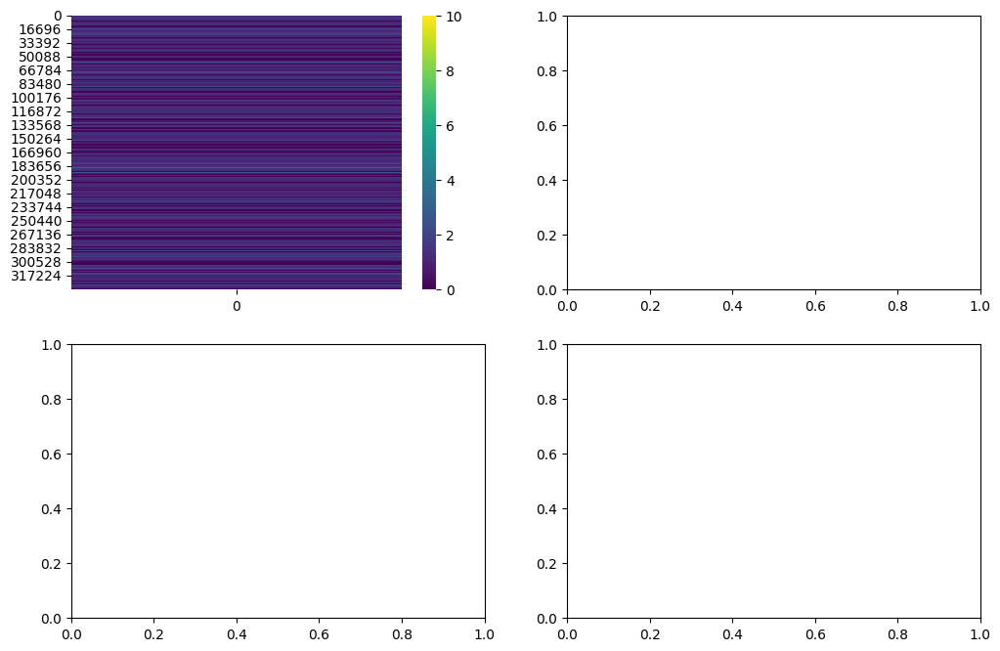

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_2_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


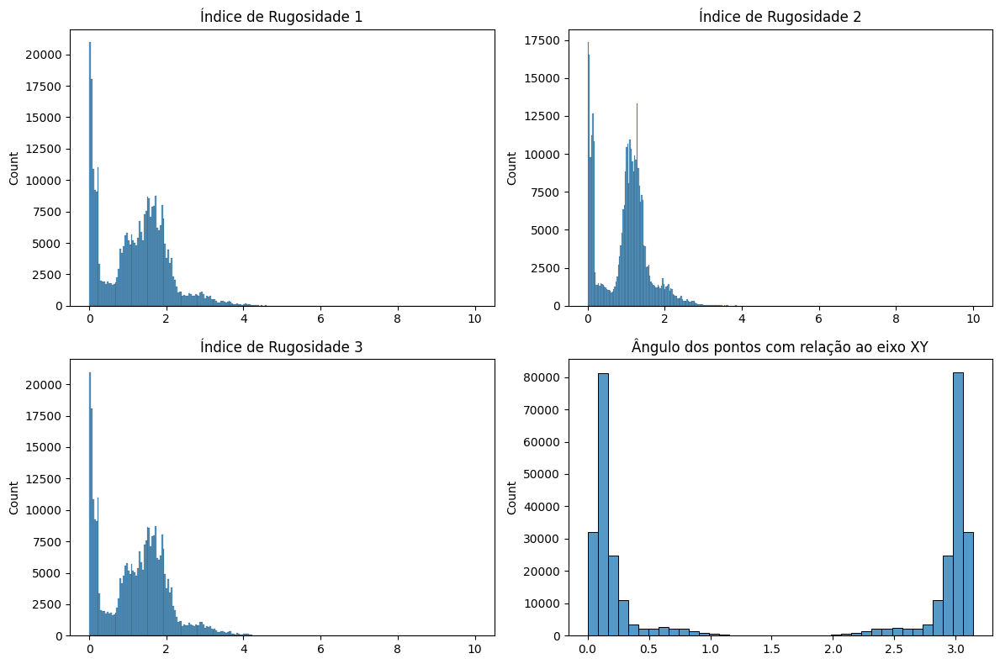

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

Mean rugosidade: 0.0027 - Resistência ao rolamento: 2


##VILA RICA TRECHO 1 - RR2% - Matrice 90 metros


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/Area_estudo_Matrice_90m.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,452761.842,6702871.945,83.175
1,452761.694,6702871.576,82.981
2,452761.446,6702871.050,82.973
3,452761.675,6702872.024,83.164
4,452761.435,6702871.483,82.984
...,...,...,...
321918,452803.010,6702837.753,80.359
321919,452802.935,6702837.562,80.359
321920,452803.220,6702837.852,80.362
321921,452803.143,6702837.688,80.363


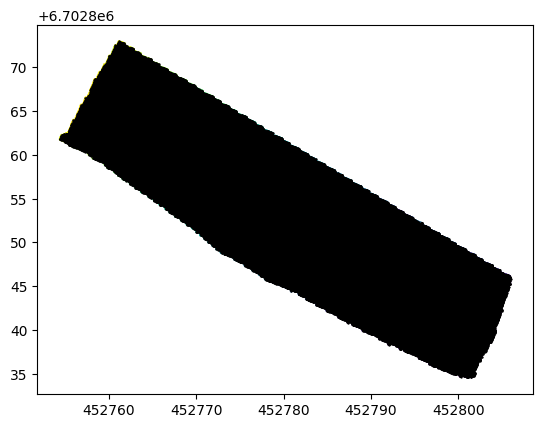

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

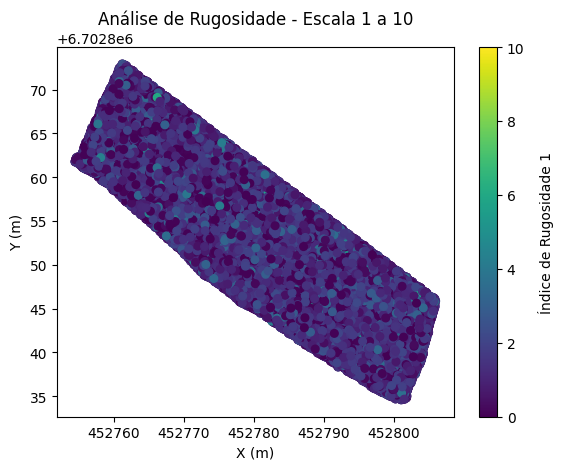

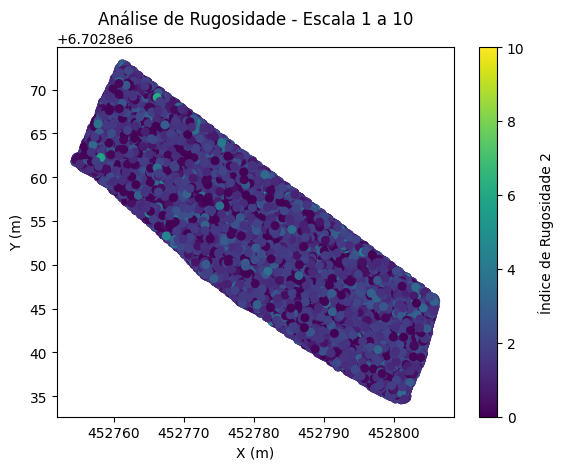

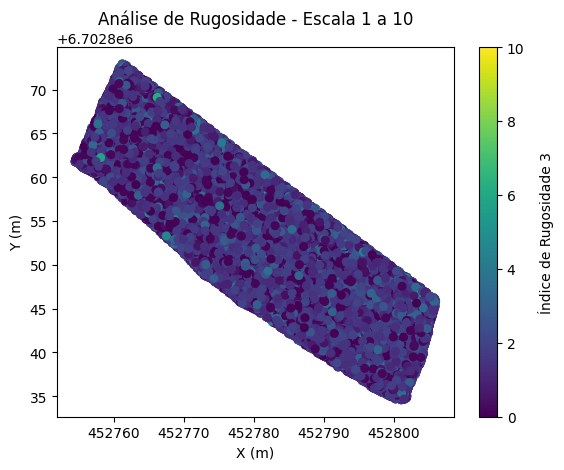

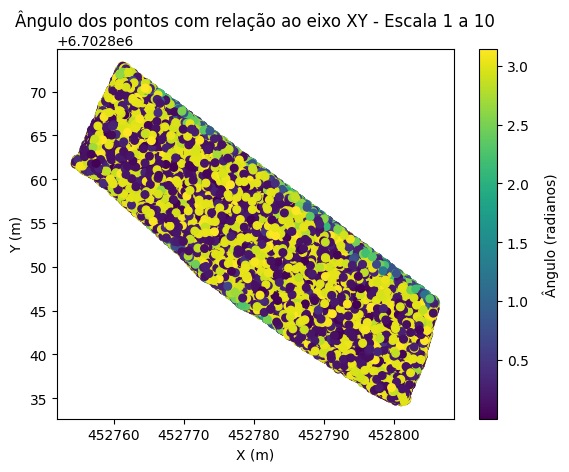

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.003986264636118994 1.2558328910119696


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 7.663126289635922e-06 0.760566926095229
Variância da rugosidade 2 (real, normalizada): 0.002100586477469973 0.7814406083911778
Variância da rugosidade 3 (real, normalizada): 0.002100586477469973 0.7814406083911778
Variância do ângulo (real, normalizada): 1.9521671788899728 19.78475006961602


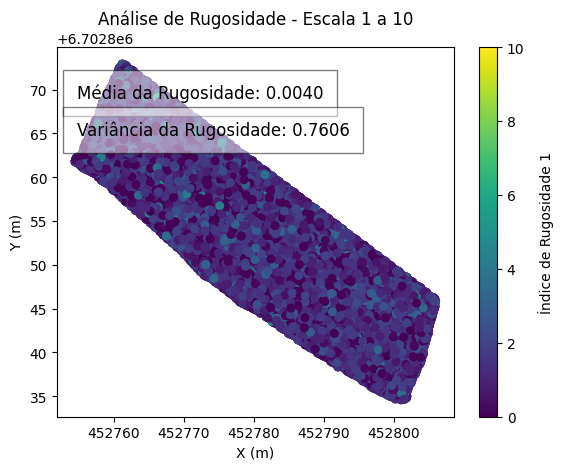

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

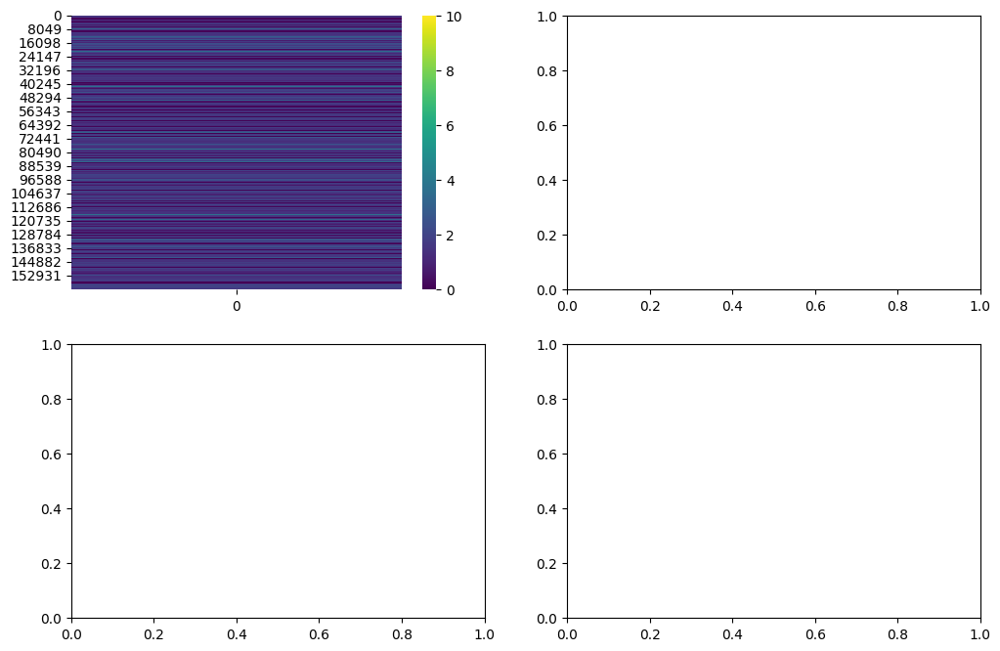

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_2_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


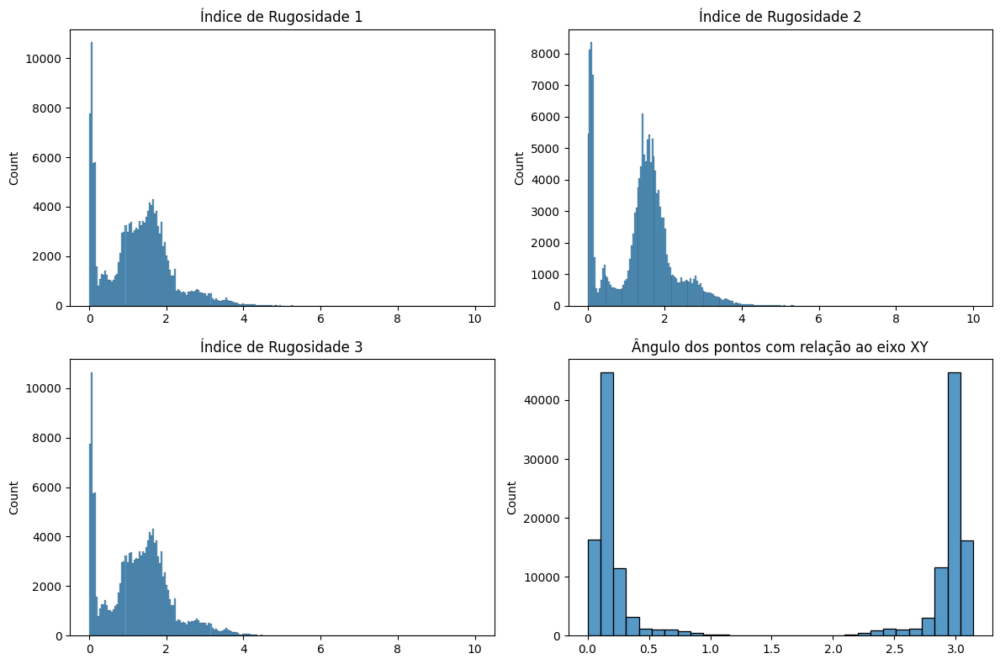

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

Mean rugosidade: 0.0040 - Resistência ao rolamento: 2


##VILA RICA TRECHO 1 - RR2% - Matrice 120 metros


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/Area_estudo_Matrice_120m_V2.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,452757.346,6702864.531,83.142
1,452757.186,6702864.819,83.146
2,452756.547,6702864.796,83.271
3,452756.319,6702864.641,83.268
4,452756.791,6702864.628,83.195
...,...,...,...
203318,452806.518,6702845.759,80.418
203319,452806.271,6702845.797,80.369
203320,452806.428,6702845.663,80.354
203321,452806.349,6702845.760,80.356


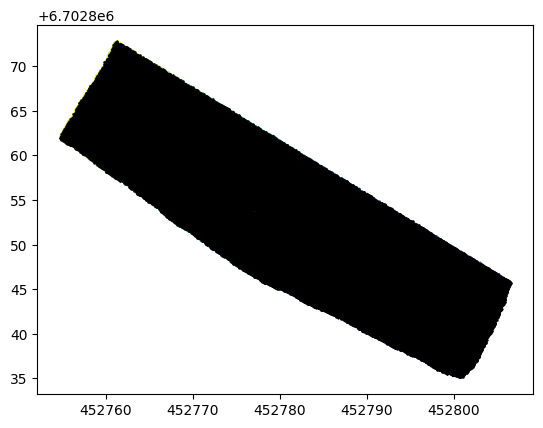

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
list_rugosidades_1


(0.004548324494695136,
 0.0008869012447056426,
 0.0013842379718226946,
 0.003378016097201099,
 0.002087852550254864,
 0.007830646690902955,
 0.006900382407652956,
 0.007299300427422462,
 0.006546456522525491,
 0.005578615116296554,
 0.0023222422399864677,
 0.007291389486979897,
 0.007740744672775094,
 0.0005841899251701506,
 0.009138049766235617,
 0.0010272309068522776,
 0.0059840507201896365,
 0.005629766441114822,
 0.0073154941917495065,
 0.008942527787719328,
 0.0016161310728917617,
 0.007069942173311047,
 0.0012372878296242325,
 0.0037292818220685153,
 0.008612465831815732,
 0.0064268771375479315,
 0.010694715416261321,
 0.00736587130882412,
 0.0016847345292881222,
 0.008706108751050752,
 0.003881185729536478,
 0.004966246891109916,
 0.007834064453709792,
 0.005758842937206519,
 0.0037974591479380494,
 0.0004394334054836788,
 0.0014424567929321298,
 0.00110175799025259,
 0.004921182395646412,
 0.005026191275747716,
 0.0040911092490222,
 0.004508360627595014,
 0.006675000515695026,


In [ ]:
a = np.array(list_rugosidades_1)

np.arange(len(a))[np.isnan(a)]

array([  896, 17937, 51344, 93536])

In [ ]:
a[94588:94592]

array([0.01011194, 0.00895829, 0.00889399, 0.01128917])

In [ ]:
list_rugosidades_1 = [x for x in list_rugosidades_1 if not np.isnan(x)]


In [ ]:
mean_rug = np.mean(list_rugosidades_1)
mean_rug

0.005159438110485039

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Filtragem de df_red para coincidir com o tamanho das listas
df_red = df_red.iloc[:len(list_rugosidades_1_scaled)]

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

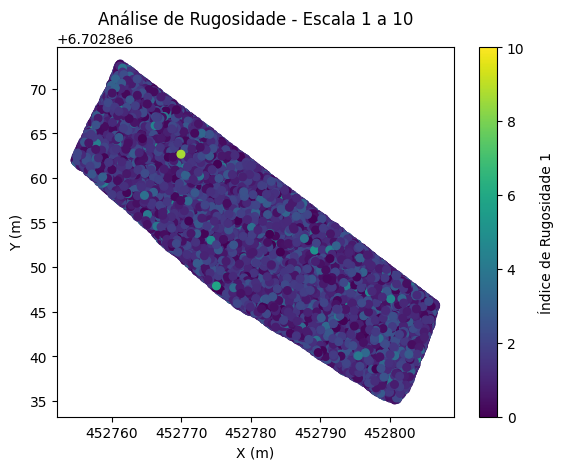

ValueError: 'c' argument has 101662 elements, which is inconsistent with 'x' and 'y' with size 101658.

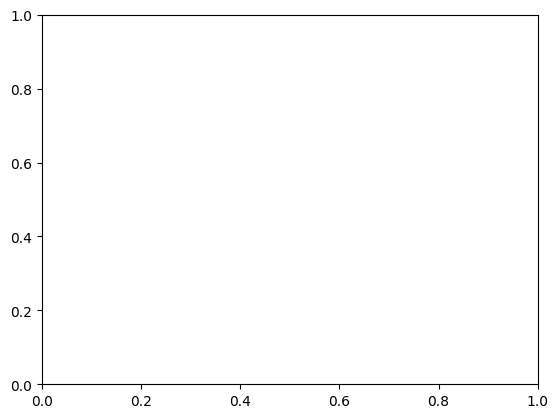

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.005159438110485039 1.3975074132381398


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 1.0381788322427728e-05 0.7616853379921144
Variância da rugosidade 2 (real, normalizada): nan nan
Variância da rugosidade 3 (real, normalizada): nan nan
Variância do ângulo (real, normalizada): 1.9244385471302825 19.52114600264275


In [ ]:
# Filtragem de df_red para coincidir com o tamanho das listas
df_red = df_red.iloc[:len(list_rugosidades_1_scaled)]

In [ ]:
# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_2_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

##VILA RICA TRECHO 1 - RR2% - Mavic 60 metros


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/Mavic_Vila_Rica_60m_27.03.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,452796.360,6702837.497,80.498
1,452796.177,6702837.042,80.453
2,452796.282,6702836.972,80.430
3,452796.367,6702837.081,80.449
4,452796.443,6702837.195,80.452
...,...,...,...
634376,452761.628,6702872.347,83.188
634377,452761.268,6702872.543,83.230
634378,452761.491,6702872.386,83.206
634379,452761.161,6702872.695,83.222


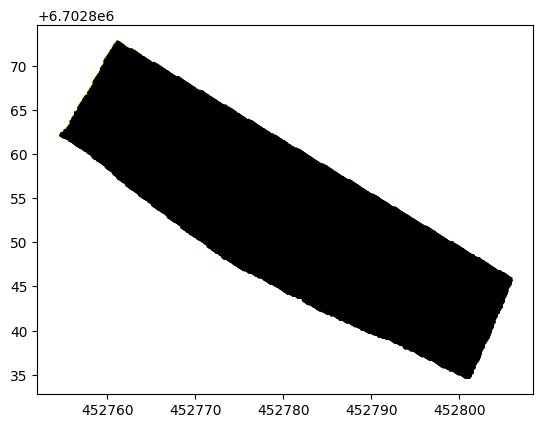

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

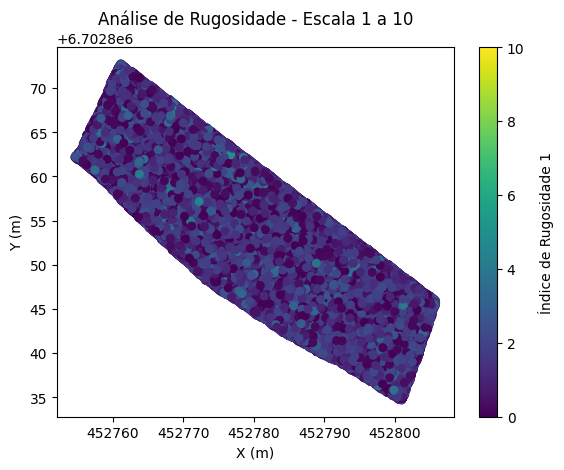

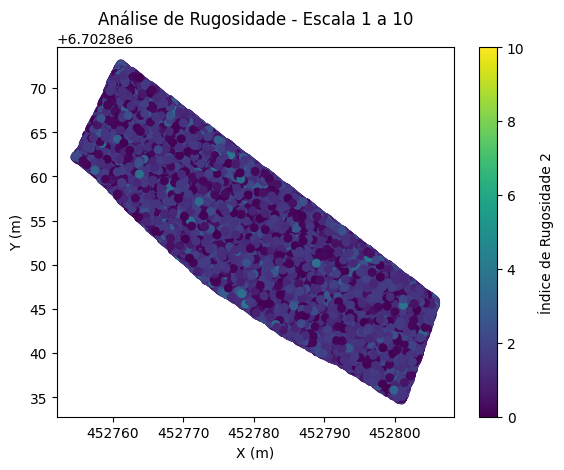

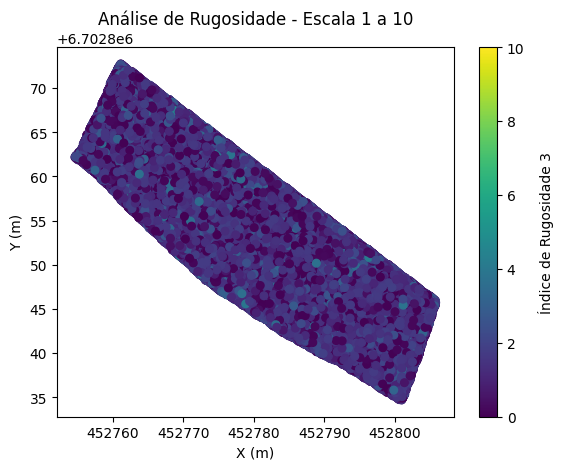

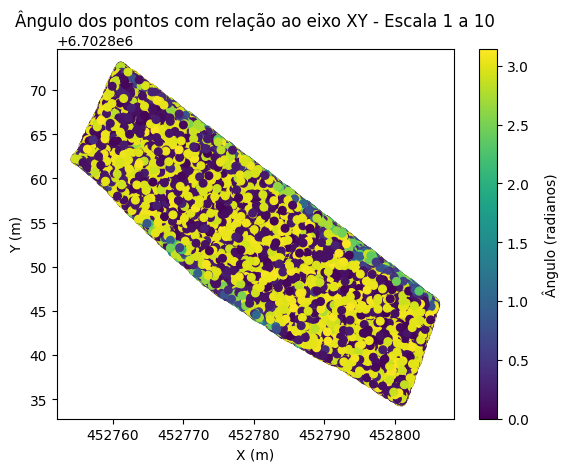

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.002735909118297899 1.285721298208336


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 3.7466786144991965e-06 0.8274405188546098
Variância da rugosidade 2 (real, normalizada): 0.001982582176991819 0.6308518141708364
Variância da rugosidade 3 (real, normalizada): 0.001982582176991819 0.6308518141708364
Variância do ângulo (real, normalizada): 1.9826492452789328 20.088436827924916


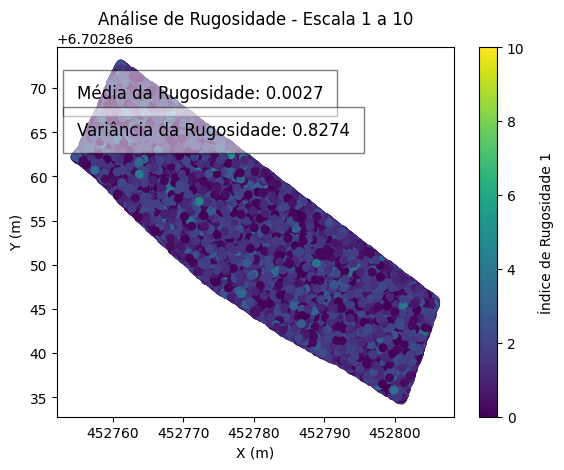

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

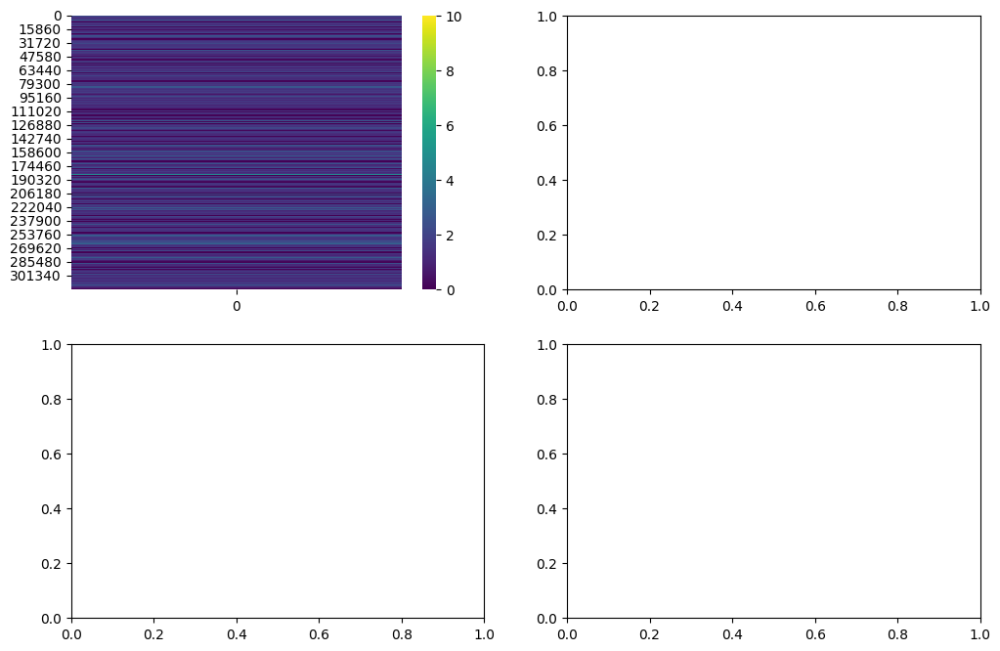

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_2_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


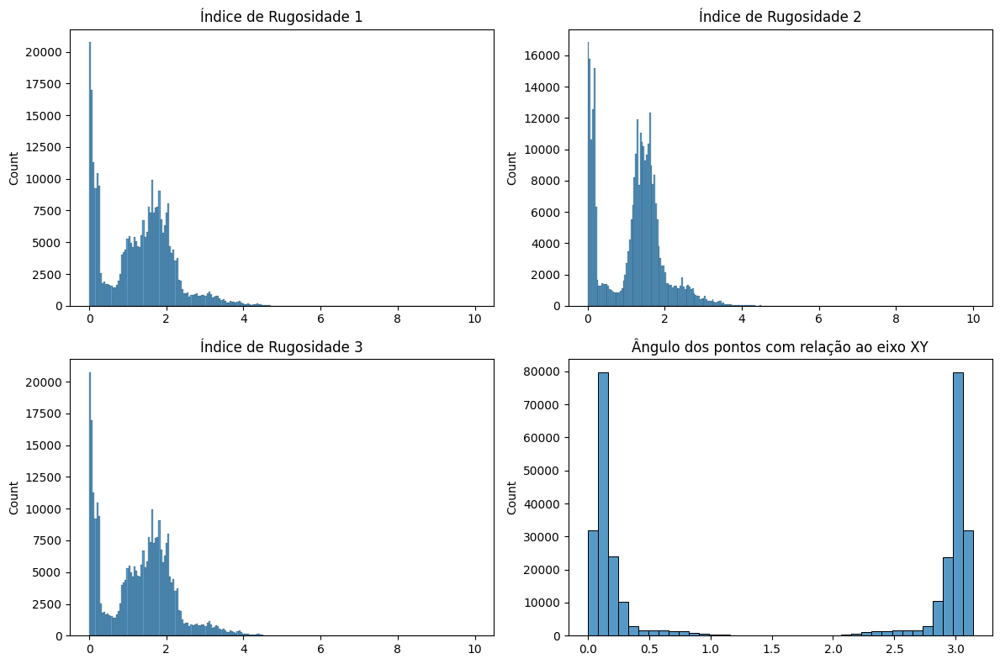

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

Mean rugosidade: 0.0027 - Resistência ao rolamento: 2


##VILA RICA TRECHO 1 - RR2% - Mavic 90 metros


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/Mavic_Vila_Rica_90m_27.03.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,452758.691,6702868.893,83.308
1,452758.725,6702868.984,83.297
2,452758.597,6702868.788,83.315
3,452758.487,6702869.039,83.317
4,452758.634,6702869.020,83.297
...,...,...,...
319112,452799.452,6702835.679,80.385
319113,452799.100,6702835.844,80.400
319114,452798.906,6702835.752,80.395
319115,452799.694,6702835.622,80.400


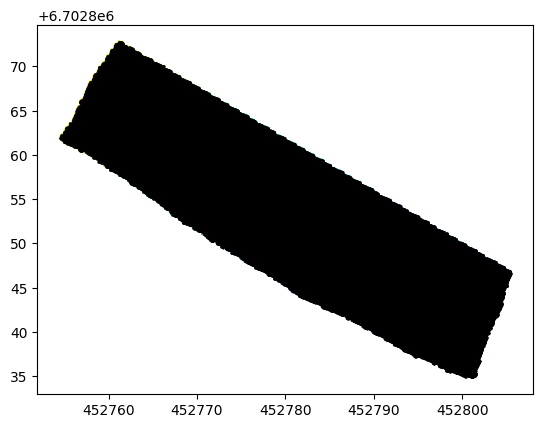

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.5)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

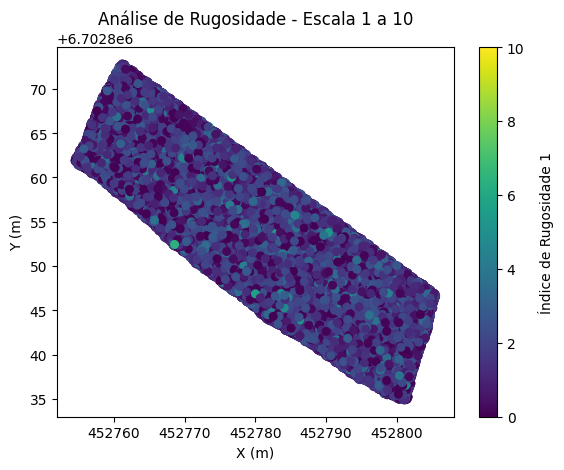

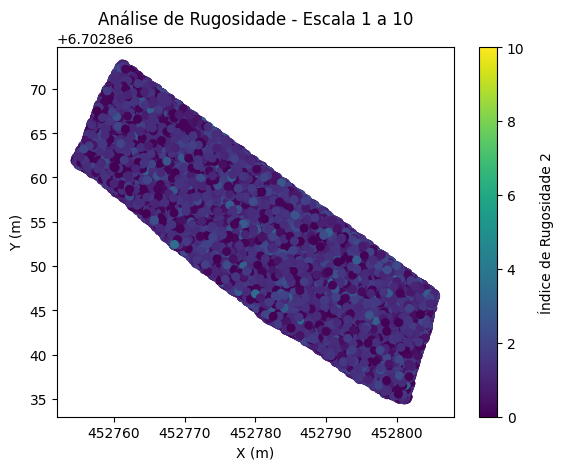

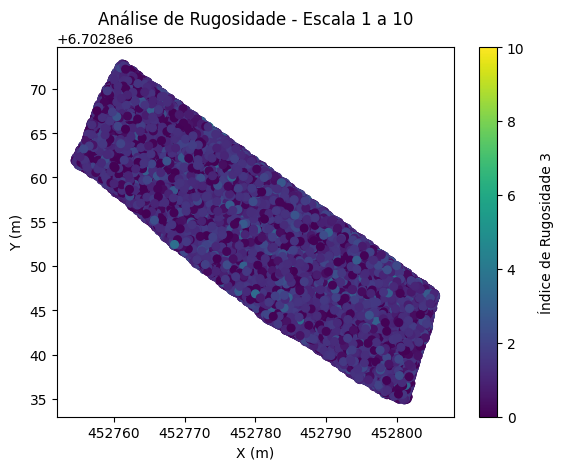

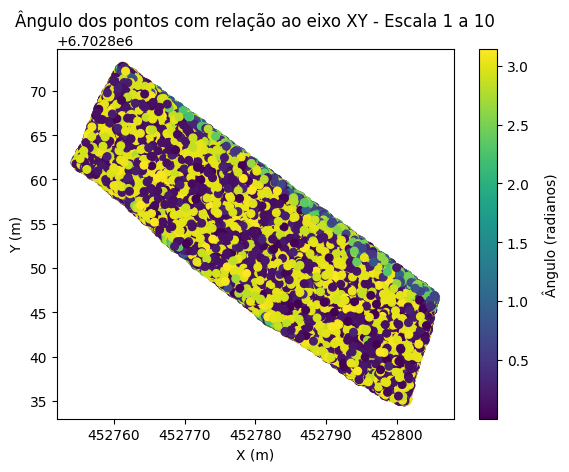

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.003941424075949977 1.5448170368268455


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 7.546965208810978e-06 1.159364821306981
Variância da rugosidade 2 (real, normalizada): 0.002099505268912759 0.545418038274566
Variância da rugosidade 3 (real, normalizada): 0.002099505268912759 0.545418038274566
Variância do ângulo (real, normalizada): 1.937452057968992 19.63605174518992


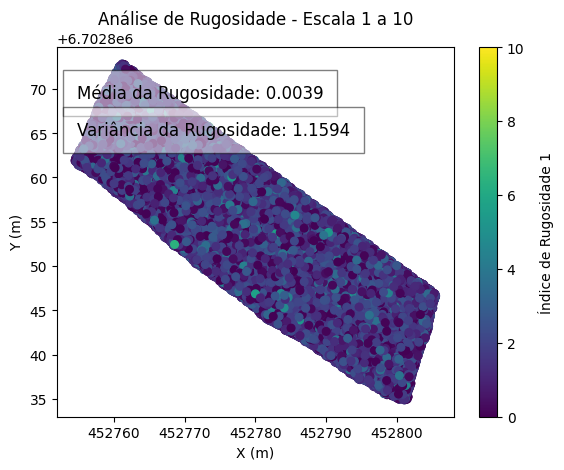

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

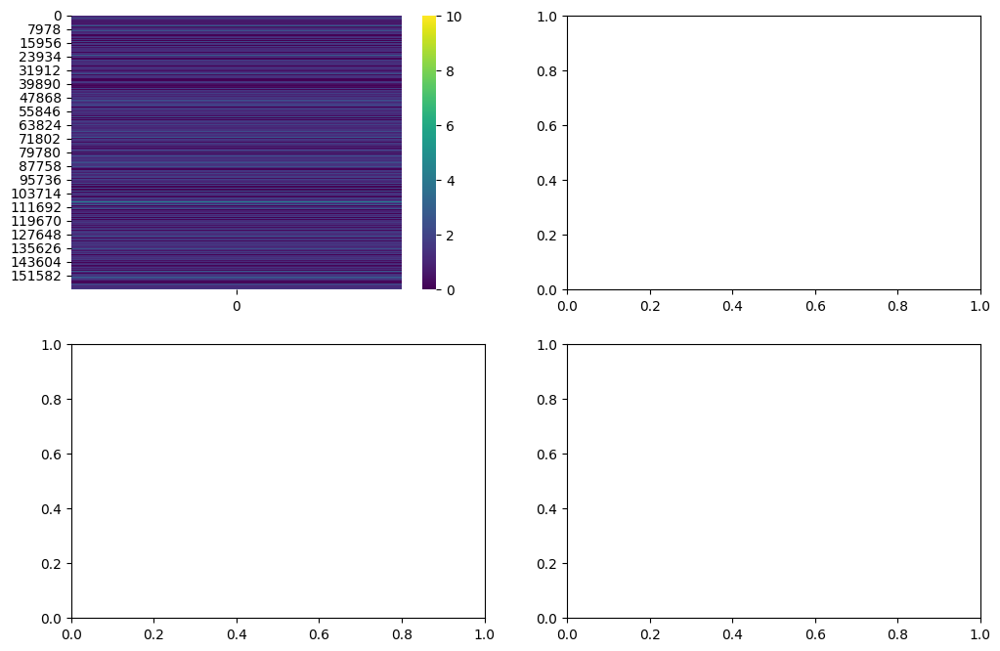

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_2_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


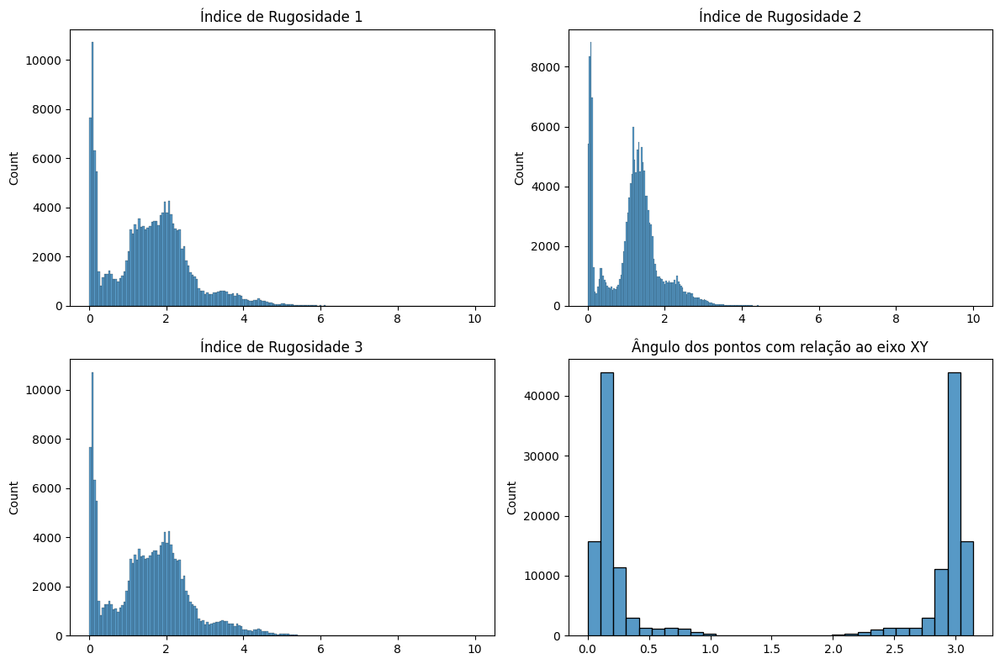

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")

Mean rugosidade: 0.0039 - Resistência ao rolamento: 2


##VILA RICA TRECHO 1 - RR2% - Mavic 120 metros


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.50)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/Mavic_Vila_Rica_120m_27.03.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,452801.245,6702835.256,80.302
1,452801.044,6702835.538,80.319
2,452800.650,6702834.841,80.314
3,452800.897,6702835.052,80.320
4,452800.692,6702835.369,80.334
...,...,...,...
187929,452761.227,6702871.794,83.008
187930,452761.176,6702871.797,83.020
187931,452761.168,6702871.222,82.992
187932,452761.105,6702872.437,83.226


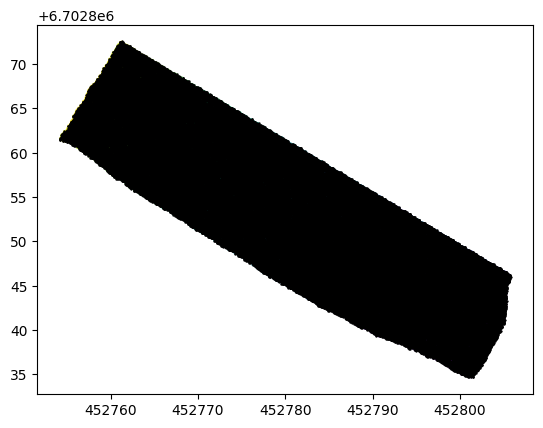

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.05)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

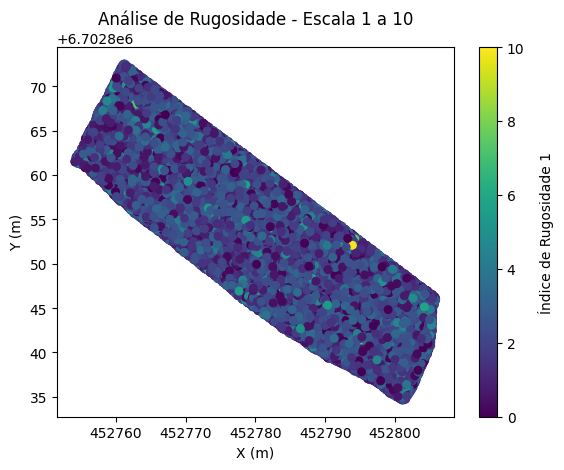

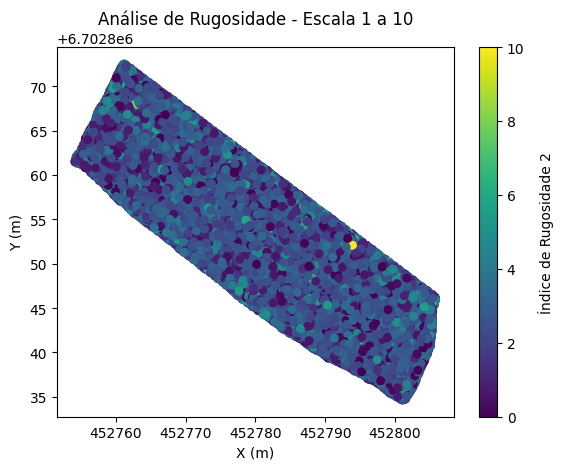

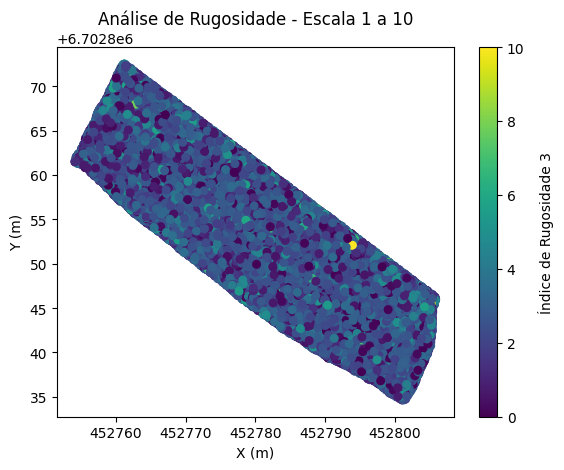

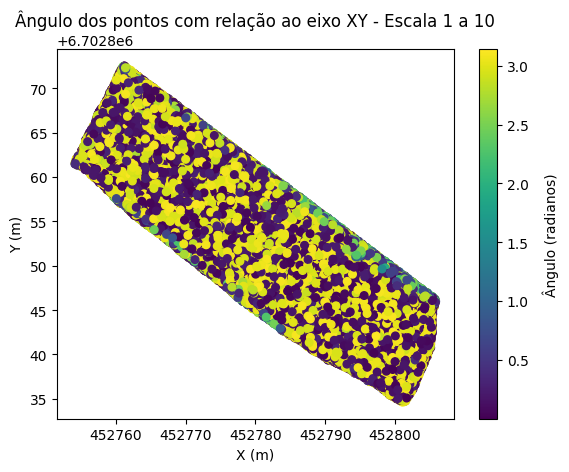

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): 0.0054542499387898605 2.0233577198200003


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): 1.0060466791746317e-05 1.384501410153763
Variância da rugosidade 2 (real, normalizada): 0.0015034678825360769 1.5626365596756493
Variância da rugosidade 3 (real, normalizada): 0.0015034678825360769 1.5626365596756493
Variância do ângulo (real, normalizada): 1.9910869643983748 20.187080794662112


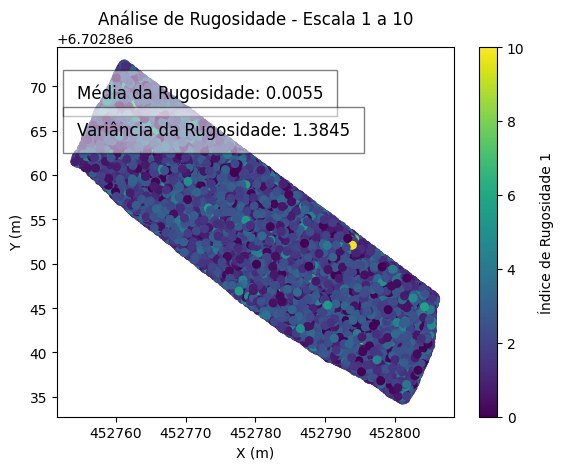

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

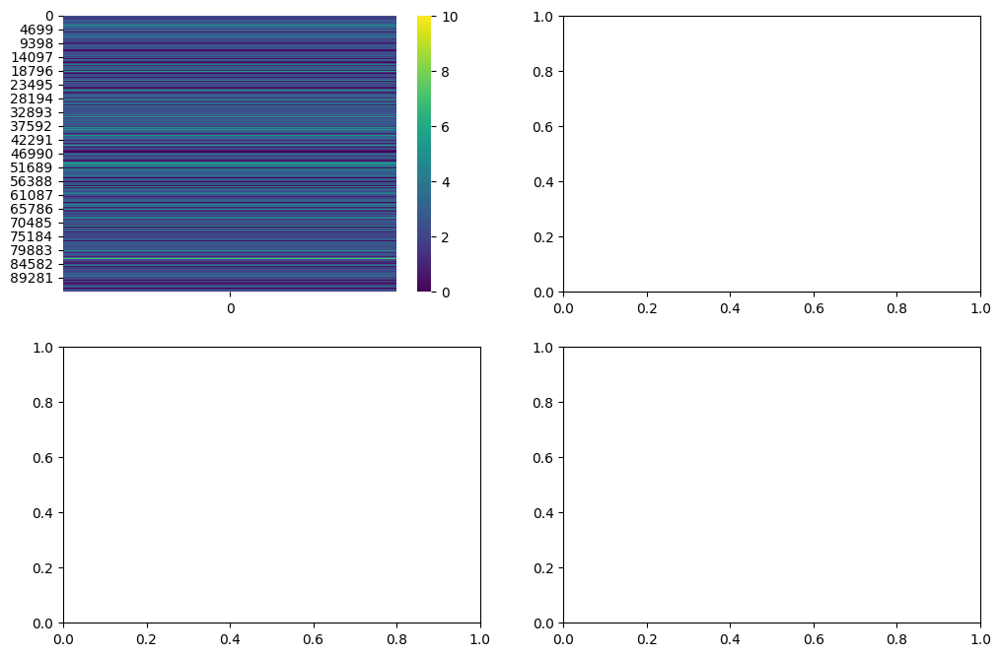

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_2_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


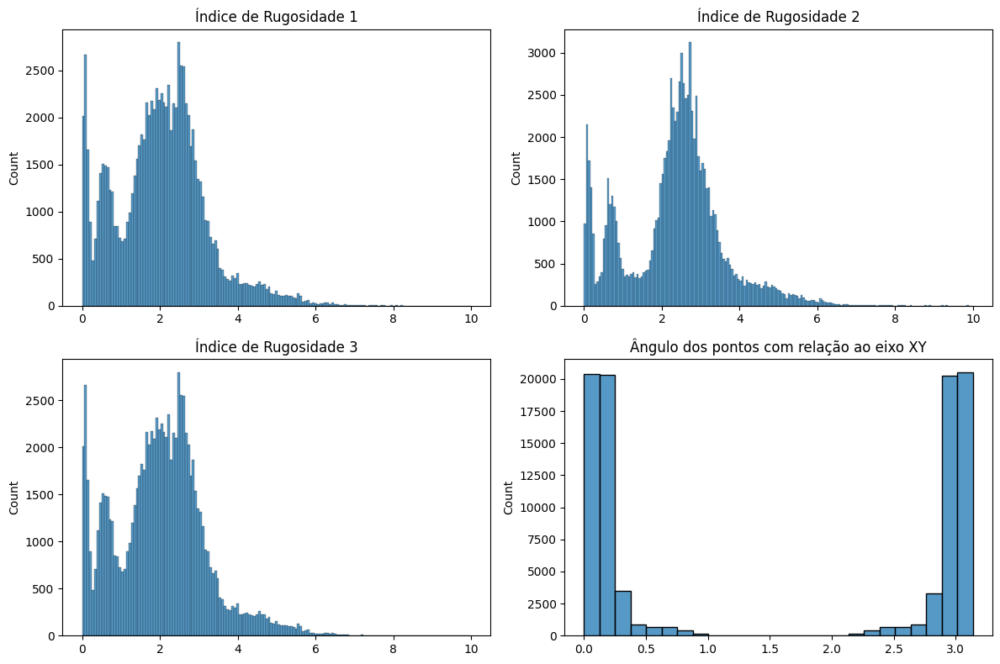

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()

#Associação da rugosidade média com a resistência ao rolamento local

In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}


In [ ]:
faixas_rugosidade = {
    "<0.01": 2,
    "0.01-0.025": 3,
    "0.025-0.035": 4,
    "0.035-0.05": 5,
    ">0.05": 6,
}

def obter_resistencia_rolando(mean_rugosidade):
    for faixa, resistencia in faixas_rugosidade.items():
        if faixa.startswith("<"):
            if mean_rugosidade < float(faixa[1:]):
                return resistencia
        elif faixa.endswith(">"):
            if mean_rugosidade > float(faixa[:-1]):
                return resistencia
        else:
            min_valor, max_valor = [float(valor) for valor in faixa.split("-")]
            if min_valor <= mean_rugosidade < max_valor:
                return resistencia
    raise ValueError(f"Mean_rugosidade ({mean_rugosidade}) fora das faixas definidas.")

# Exemplo de uso
resistencia = obter_resistencia_rolando(mean_rugosidade)
print(f"Mean rugosidade: {mean_rugosidade:.4f} - Resistência ao rolamento: {resistencia}")


Mean rugosidade: 0.0054 - Resistência ao rolamento: 2


#VILA RICA TRECHO 1 - RR2% - Matrice 120 metros


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from joblib import Parallel, delayed
import pickle
import seaborn as sns

In [ ]:
# Inicializando o PCA e o NearestNeighbors fora do loop para evitar recriação
pca = PCA(n_components=3)
neigh = NearestNeighbors(radius=0.10)

def process_point(point, df):
    idxs_neigh = neigh.kneighbors([point], return_distance=False)
    df_ = df.iloc[np.squeeze(idxs_neigh)]

    pca.fit(df_.values)

    rugosidade_1 = pca.singular_values_[2]/pca.singular_values_[0]*pca.singular_values_[1]
    rugosidade_2 = pca.singular_values_[2]/pca.singular_values_[0]
    rugosidade_3 = pca.singular_values_[2] / max(pca.singular_values_[0], pca.singular_values_[1])

    n1 = np.array([0, 0, 1]) # normal ẑ
    n2 = pca.components_[2] # normal à superfície das duas 1as componentes principais

    theta = np.arccos(n1.dot(n2) / (np.linalg.norm(n1) * np.linalg.norm(n2)))

    return rugosidade_1, rugosidade_2, rugosidade_3, theta


In [ ]:
# Carregamento dos dados
flname = '/content/drive/MyDrive/PCA_ROUGHNESS/Area_estudo_Matrice_120m_V2.txt'
df = pd.read_csv(flname, sep=' ', header=None, names=['x', 'y', 'z'], skiprows=1)
df


,x,y,z
0,452757.346,6702864.531,83.142
1,452757.186,6702864.819,83.146
2,452756.547,6702864.796,83.271
3,452756.319,6702864.641,83.268
4,452756.791,6702864.628,83.195
...,...,...,...
203318,452806.518,6702845.759,80.418
203319,452806.271,6702845.797,80.369
203320,452806.428,6702845.663,80.354
203321,452806.349,6702845.760,80.356


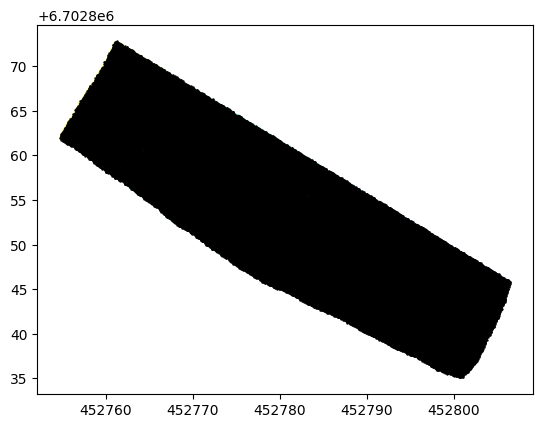

In [ ]:
df_red = df.sample(frac=0.5)
plt.scatter(df['x'], df['y'], c=df['z'], s=0.05)
plt.scatter(df_red['x'], df_red['y'], c='k', s=0.5)

In [ ]:
# Aplicando o NearestNeighbors aos dados completos
neigh.fit(df.values)

# Processamento paralelo
results = Parallel(n_jobs=-1)(delayed(process_point)(point, df) for point in df_red.values)

# Extrair os resultados em listas separadas
list_rugosidades_1, list_rugosidades_2, list_rugosidades_3, list_theta = zip(*results)

In [ ]:
def scale_values(values):
  """
  Função para escalar os valores para a escala de 1 a 10.

  Args:
      values: Uma lista de valores a serem escalados.

  Returns:
      Uma lista de valores escalados.
  """
  min_value = min(values)
  max_value = max(values)
  return [(value - min_value) / (max_value - min_value) * 10 for value in values]

In [ ]:
# Escalar os valores para a escala de 1 a 10
list_rugosidades_1_scaled = scale_values(list_rugosidades_1)
list_rugosidades_2_scaled = scale_values(list_rugosidades_2)
list_rugosidades_3_scaled = scale_values(list_rugosidades_3)
list_theta_scaled = scale_values(list_theta)

In [ ]:
# Salvar os resultados em um arquivo pickle
with open('resultados.pickle', 'wb') as f:
    pickle.dump((list_rugosidades_1_scaled, list_rugosidades_2_scaled, list_rugosidades_3_scaled, list_theta_scaled), f)

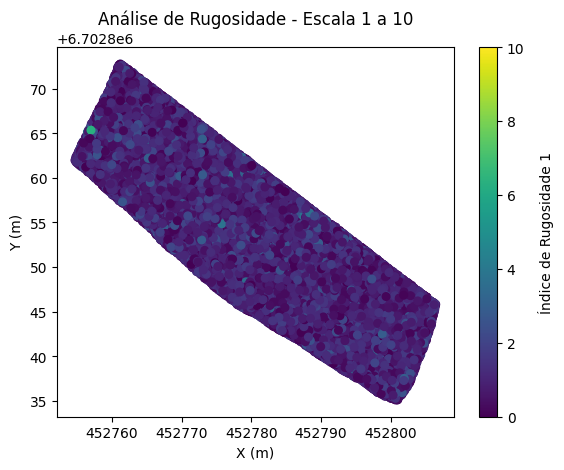

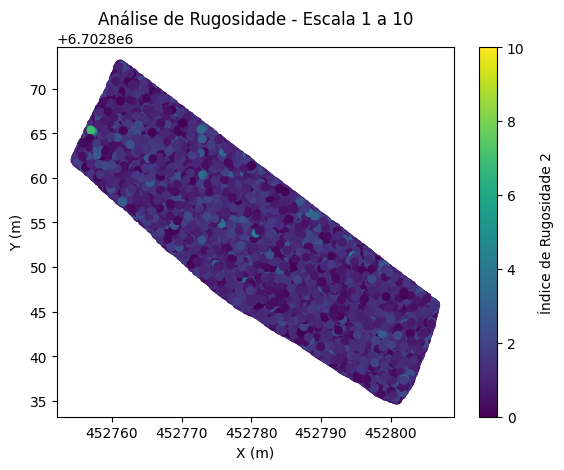

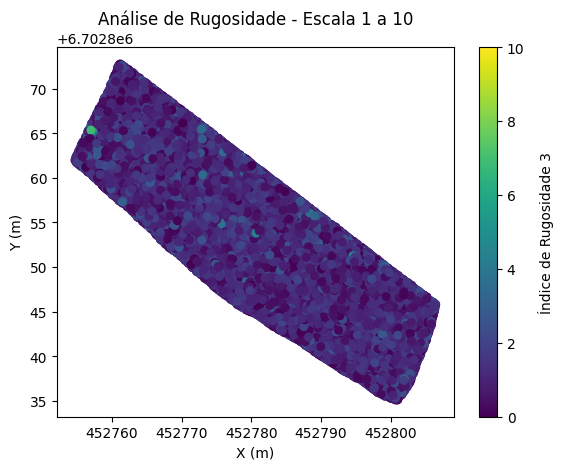

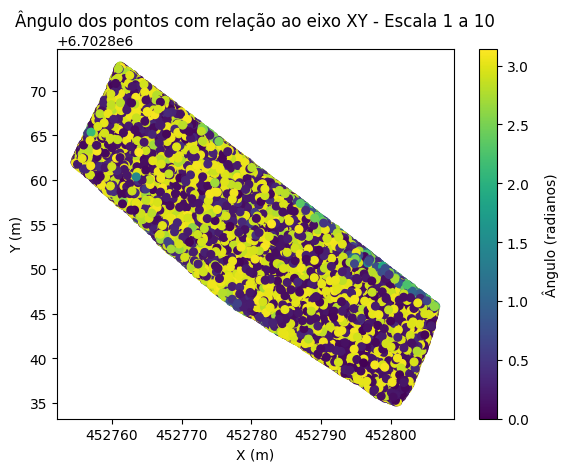

In [ ]:
# Função de plotagem reutilizável
def plot_data(x, y, c, title, xlabel, ylabel, cbar_label):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# Plotando os dados escalados
plot_data(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1')
plot_data(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2')
plot_data(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3')
plot_data(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)')

In [ ]:
# Calculando a média da rugosidade no local
mean_rugosidade = np.mean(list_rugosidades_1)
mean_rugosidade_2 = np.mean(list_rugosidades_1_scaled)
# Imprimindo o valor médio da rugosidade
print("Valor médio da rugosidade no local (real, normalizada):", mean_rugosidade, mean_rugosidade_2)

Valor médio da rugosidade no local (real, normalizada): nan nan


In [ ]:

# Variância das rugosidades não escalonadas
variance_rugosidade_1 = np.var(list_rugosidades_1)
variance_rugosidade_2 = np.var(list_rugosidades_2)
variance_rugosidade_3 = np.var(list_rugosidades_3)
variance_theta = np.var(list_theta)

# Variância das rugosidades escalonadas
variance_rugosidade_1_scaled = np.var(list_rugosidades_1_scaled)
variance_rugosidade_2_scaled = np.var(list_rugosidades_2_scaled)
variance_rugosidade_3_scaled = np.var(list_rugosidades_3_scaled)
variance_theta_scaled = np.var(list_theta_scaled)

# Imprimir as variâncias
print("Variância da rugosidade 1 (real, normalizada):", variance_rugosidade_1, variance_rugosidade_1_scaled)
print("Variância da rugosidade 2 (real, normalizada):", variance_rugosidade_2, variance_rugosidade_2_scaled)
print("Variância da rugosidade 3 (real, normalizada):", variance_rugosidade_3, variance_rugosidade_3_scaled)
print("Variância do ângulo (real, normalizada):", variance_theta, variance_theta_scaled)


Variância da rugosidade 1 (real, normalizada): nan nan
Variância da rugosidade 2 (real, normalizada): nan nan
Variância da rugosidade 3 (real, normalizada): nan nan
Variância do ângulo (real, normalizada): 1.924424594519609 19.521004469960157


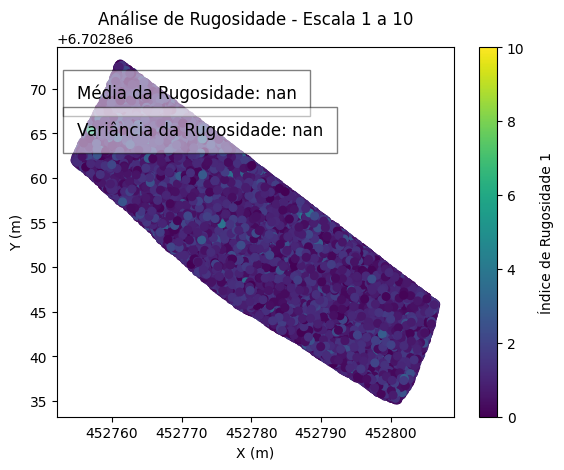

In [ ]:
# prompt: Preciso que dentro das imagens geradas (e não no eixo vertical) apareçam a média da rugosidade e a variância escalonada das rugosidades como informação adicional.

# Adicionar informações de média e variância às imagens
def plot_data_with_info(x, y, c, title, xlabel, ylabel, cbar_label, mean_roughness, var_roughness):
    plt.scatter(x, y, c=c, s=30)
    colorbar = plt.colorbar()
    colorbar.set_label(cbar_label, labelpad=10)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if mean_roughness is not None:
      plt.text(0.05, 0.9, f'Média da Rugosidade: {mean_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    else:
      plt.text(0.05, 0.9, 'Média da Rugosidade: Not applicable', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.text(0.05, 0.8, f'Variância da Rugosidade: {var_roughness:.4f}', transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 10})
    plt.show()

# Plotando os dados escalados com as informações adicionais
plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_1_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 1', mean_rugosidade, variance_rugosidade_1_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_2_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 2', mean_rugosidade_2, variance_rugosidade_2_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_rugosidades_3_scaled, 'Análise de Rugosidade - Escala 1 a 10', 'X (m)', 'Y (m)', 'Índice de Rugosidade 3', mean_rugosidade_3, variance_rugosidade_3_scaled)
#plot_data_with_info(df_red['x'], df_red['y'], list_theta, 'Ângulo dos pontos com relação ao eixo XY - Escala 1 a 10', 'X (m)', 'Y (m)', 'Ângulo (radianos)', variance_theta)


<Axes: >

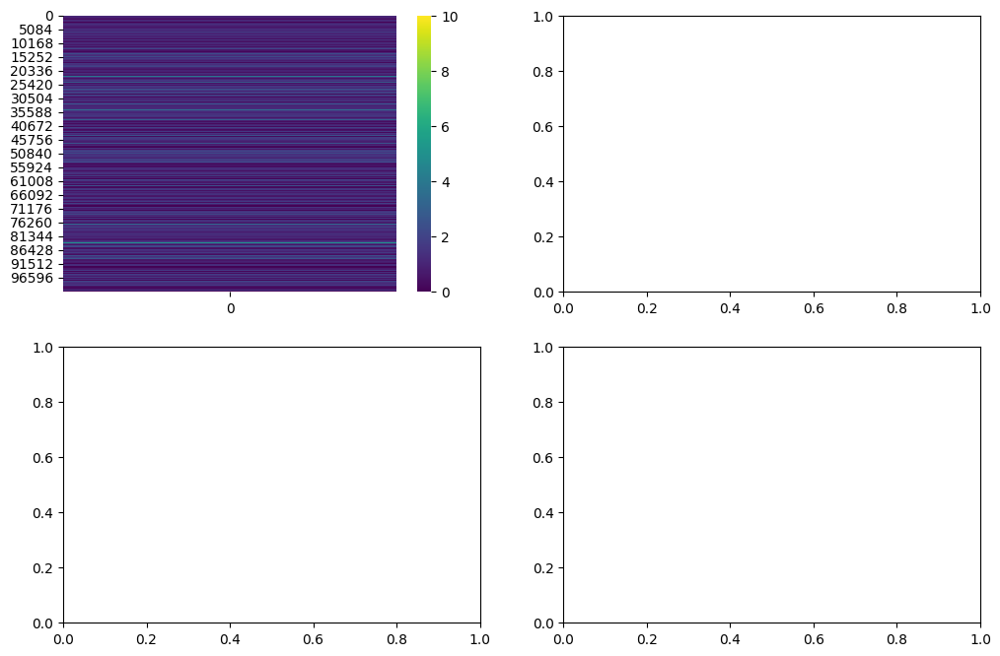

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Heatmap code using axes[0, 0] (or directly in sns.heatmap)
sns.heatmap(
    data=np.array(list_rugosidades_2_scaled).reshape(-1, 1),
    ax=axes[0, 0],  # Reference the subplot using axes
    cmap='viridis',
    vmin=0,
    vmax=10,
)


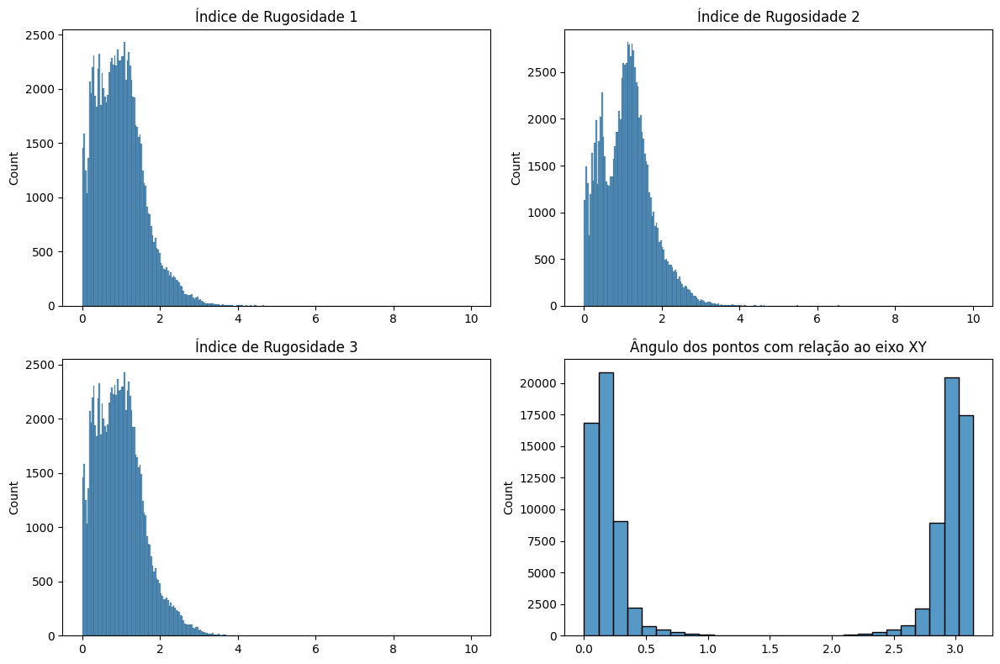

In [ ]:
# Criando a figura
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Histograma para rugosidade 1
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[0, 0])
axes[0, 0].set_title('Índice de Rugosidade 1')

# Histograma para rugosidade 2
sns.histplot(data=list_rugosidades_2_scaled, ax=axes[0, 1])
axes[0, 1].set_title('Índice de Rugosidade 2')

# Histograma para rugosidade 3
sns.histplot(data=list_rugosidades_1_scaled, ax=axes[1, 0])
axes[1, 0].set_title('Índice de Rugosidade 3')

# Histograma para ângulo
sns.histplot(data=list_theta, ax=axes[1, 1])
axes[1, 1].set_title('Ângulo dos pontos com relação ao eixo XY')

# Ajustando a figura
fig.tight_layout()
plt.show()